<h1>Hyperparameter Cross Validation</h1>

<h2>Load Forecasting, Mediumweight Model, Bidirectional</h2>

<h3>Imports and Data Instantiation</h3> 

In [2]:
# General Data Manipulation and Miscellaneous:
import numpy as np
import pandas as pd
import time
import warnings
from contextlib import contextmanager
from misc_utils import suppress_warnings, print_cuda_memory_usage
from collections import defaultdict

# Visualisation:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates # Is this still needed? 
from IPython.display import display

# Preprocessing and Statistical Functionality:
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
import math

# PyTorch: 
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

# Testing:
import unittest
from RNN_tests import TestNormalisation, TestDenormalisation
from RNN_tests import TestTimeSeriesSequenceExtraction, TestDataloaderInitialisation

# Custom Function and Class Imports: 
from data_utils import normalise_dataframe, denormalise_data, create_time_sequences_and_targets
from data_utils import generate_random_indices
from data_utils import calculate_val_loss_trend, calculate_val_loss_std, calculate_forecast_bias
from data_utils import calculate_iqr_normalised_mae, calculate_mase
from data_utils import take_logs_of_metrics_whilst_preserving_sign
from visualisations import plot_losses, plot_forecast_vs_true_values, plot_random_hourly_forecast_periods
from visualisations import plot_errors
from visualisations import style_dataframe, display_table

# Data:
df = pd.read_csv("total_df_mv.csv").drop(columns=["generation solar", "generation wind onshore"])

try:
    df["pd_datetime"] = pd.to_datetime(df["time"], utc=True, errors="raise")
    df.set_index("pd_datetime", inplace=True)
except Exception as e:
    print(f"Error converting to datetime: {e}")
    
exo_columns = ["avg_temp", "avg_humidity", "avg_wind_speed", "avg_rain_1h", "avg_clouds_all"]

series_columns = ["total load actual", "avg_temp", "avg_humidity", "avg_wind_speed", "avg_rain_1h", 
               "avg_clouds_all"]

<h3>Batch Size Instantiation</h3>

In [3]:
batch_size = 48

<h3>Device Initialisation</h3>

In [4]:
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("\nGPU is available!")
else:
    device = torch.device("cpu")
    print("\nGPU not available. Running on CPU.")



GPU is available!


<h3>Normalisation</h3>

In [5]:
normalised_df, scaler_values = normalise_dataframe(df, series_columns)

suite = unittest.TestLoader().loadTestsFromTestCase(TestNormalisation)
unittest.TextTestRunner(verbosity=2).run(suite)

test_normalisation_bounds (RNN_tests.TestNormalisation) ... ok
test_returned_columns_are_floats (RNN_tests.TestNormalisation) ... ok
test_returned_df_has_same_dimensions (RNN_tests.TestNormalisation) ... ok

----------------------------------------------------------------------
Ran 3 tests in 0.007s

OK


<unittest.runner.TextTestResult run=3 errors=0 failures=0>

<h3>Feature and Target Setup using a Sliding Window Approach</h3>

In [6]:
sequence_length = 24 

# Extracting features, X, and targets, y:
X, y = create_time_sequences_and_targets(normalised_df.values, sequence_length)

# Testing to ensure data fed into model is as expected: 
# REF: https://stackoverflow.com/questions/1322575/what-numbers-can-you-pass-as-verbosity-in-running-python-unit-test-suites
# Note: For tests to pass, the variable being forecast must be in the first column. 
suite = unittest.TestLoader().loadTestsFromTestCase(TestTimeSeriesSequenceExtraction)
suite._tests[0].setUpClass(data=normalised_df.values)
unittest.TextTestRunner(verbosity=2).run(suite)

test_array_type (RNN_tests.TestTimeSeriesSequenceExtraction) ... ok
test_shapes (RNN_tests.TestTimeSeriesSequenceExtraction) ... ok
test_target_extraction (RNN_tests.TestTimeSeriesSequenceExtraction) ... ok

----------------------------------------------------------------------
Ran 3 tests in 0.005s

OK


<unittest.runner.TextTestResult run=3 errors=0 failures=0>

<h3>Train, Val, Test Split</h3>

In [7]:
# Split Setup: 
train_proportion = 0.5
val_proportion = 0.25
test_proportion = 1 - (train_proportion + val_proportion)

#Splitting:
train_size = int(train_proportion * len(X))
val_size = int(val_proportion * len(X))

X_train, X_val, X_test = X[:train_size], X[train_size:train_size + val_size], X[train_size + val_size:]
y_train, y_val, y_test = y[:train_size], y[train_size:train_size + val_size], y[train_size + val_size:]

print(f"X_train size: {len(X_train)} | X_val size: {len(X_val)} | X_test size: {len(X_test)}")
print(f"y_train size: {len(y_train)} | y_val size: {len(y_val)} | y_test size: {len(y_test)}")

X_train size: 17520 | X_val size: 8760 | X_test size: 8760
y_train size: 17520 | y_val size: 8760 | y_test size: 8760


<h3>Dataloader Instantiation</h3>

In [8]:
# Converting data to PyTorch tensors:
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32)

X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.float32)

X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.float32)

# Creating TensorDatasets:
train_data = TensorDataset(X_train_tensor, y_train_tensor)
val_data = TensorDataset(X_val_tensor, y_val_tensor)
test_data = TensorDataset(X_test_tensor, y_test_tensor)

# Creating DataLoaders:
train_loader = DataLoader(dataset=train_data, batch_size=batch_size, shuffle=False)
val_loader = DataLoader(dataset=val_data, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_data, batch_size=batch_size, shuffle=False)
# (I don't want to shuffle sequential data as the order matters)


# I get a warning about copying tensors to other tensors in the unit tests, but I am not doing this as
# ... they are originally np arrays, and therefore: 
# REF: https://stackoverflow.com/questions/14463277/how-to-disable-python-warnings
with suppress_warnings(UserWarning):
    suite = unittest.TestLoader().loadTestsFromTestCase(TestDataloaderInitialisation)
    unittest.TextTestRunner(verbosity=2).run(suite)

test_test_loader_length (RNN_tests.TestDataloaderInitialisation) ... ok
test_train_loader_length (RNN_tests.TestDataloaderInitialisation) ... ok
test_val_loader_length (RNN_tests.TestDataloaderInitialisation) ... ok

----------------------------------------------------------------------
Ran 3 tests in 0.005s

OK


<h3>Training Loop Function</h3>

In [9]:
def train_model(model, criterion, optimiser):
    
    val_loss_best = 10000000
    no_improvement_epoch_sequence_length = 0
    # This sets the limit for how many epochs the model can go without improving:
    early_stopping_limit = 10
    early_stop_counter = 0
    epoch_counter = 0
    
    model.train() 
    
    overall_start_time = time.time()

    train_losses = []
    val_losses = []

    model = model.to(device)

    # Initialising hidden and cell states at the start of training - stateful approach:
    h0, c0 = model.init_hidden_and_cell_states(batch_size)
    h0, c0 = h0.to(device), c0.to(device)

    for epoch in range(1, epochs + 1):

        batch_process_counter = 0

        total_epoch_train_loss = 0.0

        for batch_X, batch_y in train_loader:

            batch_X, batch_y = batch_X.to(device), batch_y.to(device)

            # Forward pass:
            outputs, (hn, cn) = model(batch_X, h0, c0)
            outputs = outputs.squeeze(1) # Removing additional dimension to turn back to vector. 
            loss = criterion(outputs, batch_y)
            total_epoch_train_loss += loss.item() # .item() to get the numerical value from the tensor!

            # Backward pass and optimisation:
            optimiser.zero_grad()
            loss.backward()
            # GRADIENT CLIPPING:
            #torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimiser.step()

            # Update hidden and cell states for the next iteration:
            h0, c0 = hn.detach(), cn.detach()

            batch_process_counter += 1

        # Batch loss averaging and tracking:
        train_losses.append(total_epoch_train_loss / len(train_loader))

        # Validation evaluation and possible early stopping:
        val_loss = evaluate(model, criterion, val_loader, device)
        val_losses.append(val_loss)
        
        if val_loss < val_loss_best:
            val_loss_best = val_loss
            no_improvement_epoch_sequence_length = 0
        else:
            no_improvement_epoch_sequence_length += 1

        if no_improvement_epoch_sequence_length >= early_stopping_limit:
            print(f"Early stopping due to no improvement. {epoch} epochs.")
            early_stop_counter = 1
            break

        # Back into train mode after evaluating so backpropagation is possible again: 
        model.train() 
    
    if early_stop_counter == 0:
        print(f"No early stopping.")
    overall_end_time = time.time()

    computation_time_mins = (overall_end_time - overall_start_time) / 60
    
    return train_losses, val_losses, computation_time_mins, epoch_counter


<h3>Evaluation Loop</h3>

In [10]:
def evaluate(model, criterion, val_or_test_loader, device, test_evaluation=False):
    model.eval()  
    total_loss = 0
    
    if test_evaluation: 
        all_true_values = []
        all_predicted_values = []
    
    with torch.no_grad(): 
        for inputs, targets in val_or_test_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            
            # Stateless evaluation to avoid individual batches altering batch evaluation too much:
            h0, c0 = model.init_hidden_and_cell_states(inputs.size(0))
            h0, c0 = h0.to(device), c0.to(device)
            
            outputs, _ = model(inputs, h0, c0)
            outputs = outputs.squeeze(1) # Removing extra dimension.
            
            if test_evaluation:
                # REF: https://www.geeksforgeeks.org/append-extend-python/
                # Extend adds each element to a list rather than adding the whole argument as one. See ref.
                all_true_values.extend(targets.cpu().numpy())
                all_predicted_values.extend(outputs.cpu().numpy())
            
            loss = criterion(outputs, targets)
            total_loss += loss.item()

    average_mean_loss = total_loss / len(val_or_test_loader)
    
    if test_evaluation: 
        return average_mean_loss, all_true_values, all_predicted_values
    else: 
        return average_mean_loss

<h2>Cross Validation Nested Loops</h2>

In [11]:
from RNN_models import MediumweightLSTM

input_dim = 6 # load + 5 exogenous weather variables.
num_layers = 2
final_dropout = 0.1
weight_decay = 1e-06
#batch_size = 48
epochs = 200
graph_title_note = "mediumweight_bidirectional_1hr"
cv_model_name = "mediumweight_1hr_bi"

# Hyperparameters to change:
hidden_dim_values = [100, 200, 400] 
lr_values = [1e-03, 1e-04, 1e-05]
lstm_dropout_values = [0.2, 0.5, 0.8]
optimisers = ["Adam", "RMSProp"]

experiment_results = {}
experiment_start_number = 2295
experiment_number = experiment_start_number
model_print_counter = 1


cross_val_start_time = time.time()

for hidden_dim in hidden_dim_values:
    for lr in lr_values:
        for lstm_dropout in lstm_dropout_values:
            for optimiser_key in optimisers:
                
                # 1. Initialising Model:
                experiment_number += 1
                model = MediumweightLSTM("mediumweight_bidirectional", input_dim, hidden_dim, num_layers, lstm_dropout, final_dropout, is_bidirectional=True)
                if model_print_counter == 1:
                    print(f"\nModel: {model.model_name}\n\n")
                    model_print_counter = 0
                criterion = nn.MSELoss()
                if optimiser_key == "Adam":
                    optimiser = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
                elif optimiser_key == "RMSProp":
                    optimiser = torch.optim.RMSprop(model.parameters(), lr=lr, weight_decay=weight_decay)
                elif optimiser_key == "SGD":
                    optimiser = torch.optim.SGD(model.parameters(), lr=lr, weight_decay=weight_decay)
                else:
                    raise ValueError(f"Invalid optimiser. Must be string input; Adam, RMSProp or SGD.")
                    
                experiment_name = f"hidden_dim: {hidden_dim}, lr: {lr}, lstm_dropout: {lstm_dropout}, optimiser: {optimiser_key}"
                experiment_id = f"hd{hidden_dim}_lr{lr}_drop{lstm_dropout}_opt:{optimiser_key}"
                
                # 2. Model training:
                train_losses, val_losses, computation_time, epochs_trained = train_model(model, criterion, optimiser)

                # 3. Evaluating Model and Denormalising Values:  
                test_loss, test_true_values, test_predicted_values = evaluate(model, criterion, test_loader, device, test_evaluation=True)
                true_denorm, forecast_denorm = denormalise_data(test_true_values, test_predicted_values, scaler_values, "total load actual")
            
                # 4. Computing Metrics:
                iqr_n_mae = calculate_mase(true_denorm, forecast_denorm)
                mase = calculate_mase(true_denorm, forecast_denorm)
                mse = mean_squared_error(true_denorm, forecast_denorm)
                rmse = math.sqrt(mse)
                latter_val_gradient = calculate_val_loss_trend(val_losses, 75)
                val_loss_stabilisation = calculate_val_loss_std(val_losses, 0.001)
                forecast_bias = calculate_forecast_bias(test_predicted_values, test_true_values)
                
                # 5. Recording Results:
                experiment_results[experiment_number] = {
                    "experiment_number": experiment_number,
                    "experiment_id": experiment_id,
                    "hidden_dim": hidden_dim,
                    "lr": lr,
                    "lstm_dropout": lstm_dropout,
                    "optimiser": optimiser_key,
                    "train_losses": train_losses,
                    "val_losses": val_losses,
                    "true_denorm": true_denorm,
                    "forecast_denorm": forecast_denorm,
                    "test_loss": test_loss, 
                    "iqr_n_mae": iqr_n_mae,
                    "mase": mase,
                    "rmse": rmse,
                    "latter_val_gradient": latter_val_gradient,
                    "val_loss_stabilisation": val_loss_stabilisation,
                    "forecast_bias": forecast_bias,
                    "computation_time": computation_time }
                
                # 6. Printing Results:
                print(f"|| Experiment {experiment_number}: ({experiment_name}) : MASE {mase:.2f} ||")
                # print(f"|| Test Loss: {test_loss}  ||")
                # print(f"|| IQR Normalised MAE: {iqr_n_mae}  ||")
                # print(f"|| MASE: {mase}  ||")
                # print(f"|| RMSE: {rmse}  ||")
                # print(f"|| Latter Val Gradient: {latter_val_gradient}  ||")
                # print(f"|| Val Loss Stabilisation: {val_loss_stabilisation}  ||")
                # print(f"|| Forecast Bias: {forecast_bias}  ||")
                # print(f"|| Computation Time: {computation_time}  ||")
                # #print_cuda_memory_usage()
                # print("\n")
                
                # 7. Saving Model:
                torch.save(model.state_dict(), f"saved_models/{experiment_number}_{model.model_name}.pth")

cross_val_end_time = time.time()
cross_val_duration = (cross_val_end_time - cross_val_start_time) / 60
print(f"\n\nCross Validation Duration: {cross_val_duration: .2f} minutes.\n\n")


# Finding the best experiment for each metric: 
evaluation_metrics = ["test_loss", "iqr_n_mae", "mase", "rmse", "latter_val_gradient", 
                     "val_loss_stabilisation", "forecast_bias", "computation_time"]
best_experiments = {}

def process_best_experiment(metric, experiment_number, display_metric_name=None, label_prefix="Best experiment for"):
    if display_metric_name is None:
        display_metric_name = metric
    best_experiment = experiment_results[experiment_number]
    best_experiments[display_metric_name] = best_experiment
    if display_metric_name == "most_negative_gradient" or display_metric_name == "closest_to_zero_gradient":
        print(f"{label_prefix}: {experiment_number}  :  {best_experiment[metric]}")
    else: 
        print(f"{label_prefix} {display_metric_name}: {experiment_number}  :  {best_experiment[metric]}")

for metric in evaluation_metrics:
    if metric == "val_loss_stabilisation":
        best_experiment_number = min(
            {k: v for k, v in experiment_results.items() if isinstance(v[metric], (int, float))},
            key=lambda k: experiment_results[k][metric]
        )
        process_best_experiment(metric, best_experiment_number)

    elif metric == "latter_val_gradient":
        # Most negative gradient:
        most_negative_gradient_experiment_number = min(
            experiment_results, key=lambda k: experiment_results[k][metric]
        )
        process_best_experiment(metric, most_negative_gradient_experiment_number, "most_negative_gradient", label_prefix="Fastest gradient descent at final epoch")

        # Gradient closest to zero:
        closest_to_zero_gradient_experiment_number = min(
            experiment_results, key=lambda k: abs(experiment_results[k][metric])
        )
        process_best_experiment(metric, closest_to_zero_gradient_experiment_number, "closest_to_zero_gradient", label_prefix="Lowest gradient at last epoch")

    
    elif metric == "forecast_bias":
        best_experiment_number = min(
            experiment_results, key=lambda k: abs(experiment_results[k][metric])
        )
        process_best_experiment(metric, best_experiment_number)
    
    else:
        best_experiment_number = min(experiment_results, key=lambda k: experiment_results[k][metric])
        process_best_experiment(metric, best_experiment_number)

    
# Finding the three best experiments for normalised mean of test_loss (MSE) and MASE; NMKM:
test_loss_values = [experiment_results[exp]["test_loss"] for exp in experiment_results]
mase_values = [experiment_results[exp]["mase"] for exp in experiment_results]

test_loss_min, test_loss_max = min(test_loss_values), max(test_loss_values)
mase_min, mase_max = min(mase_values), max(mase_values)

for experiment in experiment_results:
    experiment_results[experiment]["test_loss_normalised"] = (experiment_results[experiment]["test_loss"] - test_loss_min) / (test_loss_max - test_loss_min)
    experiment_results[experiment]["mase_normalised"] = (experiment_results[experiment]["mase"] - mase_min) / (mase_max - mase_min)
    experiment_results[experiment]["nmkm_score"] = (experiment_results[experiment]["test_loss_normalised"] * 0.5) + (experiment_results[experiment]["mase_normalised"] * 0.5)

sorted_experiments = sorted(experiment_results, key=lambda k: experiment_results[k]["nmkm_score"])
best_nmkm_exp = sorted_experiments[0]
second_best_nmkm_exp = sorted_experiments[1]
third_best_nmkm_exp = sorted_experiments[2]

best_experiments["best_nmkm"] = experiment_results[best_nmkm_exp]
best_experiments["second_best_nmkm"] = experiment_results[second_best_nmkm_exp]
best_experiments["third_best_nmkm"] = experiment_results[third_best_nmkm_exp]

print(f"Best experiment based on nmkm: {best_nmkm_exp}  :  {best_experiments['best_nmkm']['nmkm_score']}")
print(f"Second best experiment based on nmkm: {second_best_nmkm_exp}  :  {best_experiments['second_best_nmkm']['nmkm_score']}")
print(f"Third best experiment based on nmkm: {third_best_nmkm_exp}  :  {best_experiments['third_best_nmkm']['nmkm_score']}")


# Displaying the key information on the best models:
experiment_hyperparameters = ["hidden_dim", "lr", "lstm_dropout", "dropout"]
# best experiments_unique_ids:
beui = defaultdict(list)

def print_experiment_details(experiment_id, metrics_tested):
    print(f"\n|| Experiment {experiment_id}, best performance for: {metrics_tested}")
    for metric in experiment_hyperparameters + evaluation_metrics:
        print(f"|| {metric}: {experiment_results[experiment_id].get(metric, 'N/A')}  ||")

print(f"\n\n== BEST EXPERIMENTS ==")

for exp_name, exp_data in best_experiments.items():
    experiment_num = exp_data["experiment_number"]
    beui[experiment_num].append(exp_name)

for experiment_id, metrics_tested in beui.items():
    print_experiment_details(experiment_id, ", ".join(metrics_tested))



Model: lightweight_bidirectional


No early stopping.
|| Experiment 1970: (hidden_dim: 100, lr: 0.001, lstm_dropout: 0.2, optimiser: Adam) : MASE 0.62 : Epochs 0 ||
No early stopping.
|| Experiment 1971: (hidden_dim: 100, lr: 0.001, lstm_dropout: 0.2, optimiser: RMSProp) : MASE 0.53 : Epochs 0 ||
No early stopping.
|| Experiment 1972: (hidden_dim: 100, lr: 0.001, lstm_dropout: 0.5, optimiser: Adam) : MASE 0.64 : Epochs 0 ||
No early stopping.
|| Experiment 1973: (hidden_dim: 100, lr: 0.001, lstm_dropout: 0.5, optimiser: RMSProp) : MASE 0.60 : Epochs 0 ||
No early stopping.
|| Experiment 1974: (hidden_dim: 100, lr: 0.001, lstm_dropout: 0.8, optimiser: Adam) : MASE 0.70 : Epochs 0 ||
No early stopping.
|| Experiment 1975: (hidden_dim: 100, lr: 0.001, lstm_dropout: 0.8, optimiser: RMSProp) : MASE 0.78 : Epochs 0 ||
No early stopping.
|| Experiment 1976: (hidden_dim: 100, lr: 0.0001, lstm_dropout: 0.2, optimiser: Adam) : MASE 1.37 : Epochs 0 ||
No early stopping.
|| Experiment 1977: (hidd

<h3>Heatmaps</h3>



== Heatmaps ==

test_loss


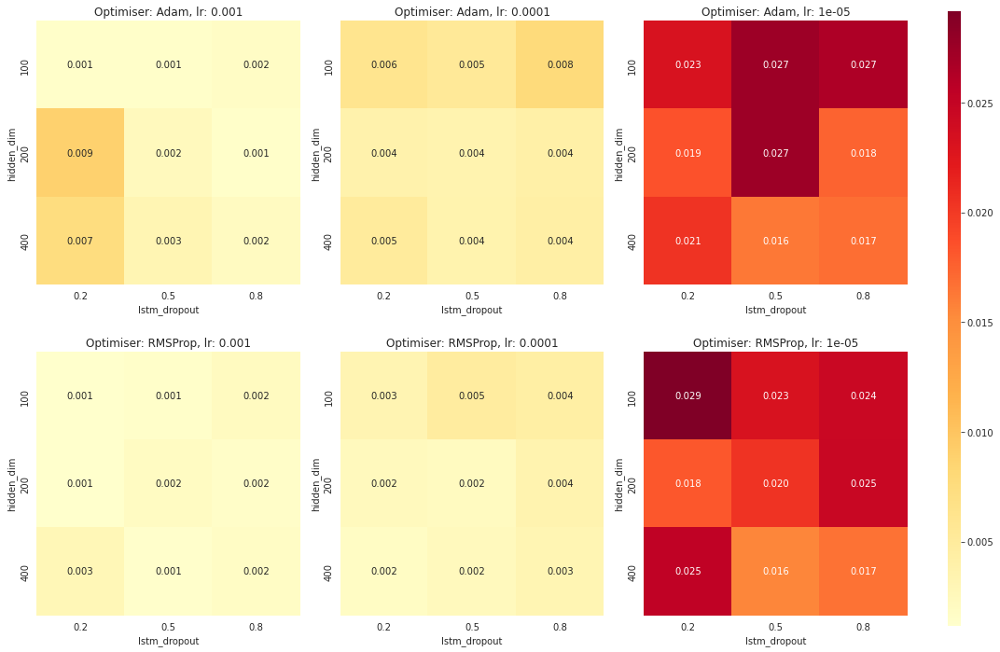




mase


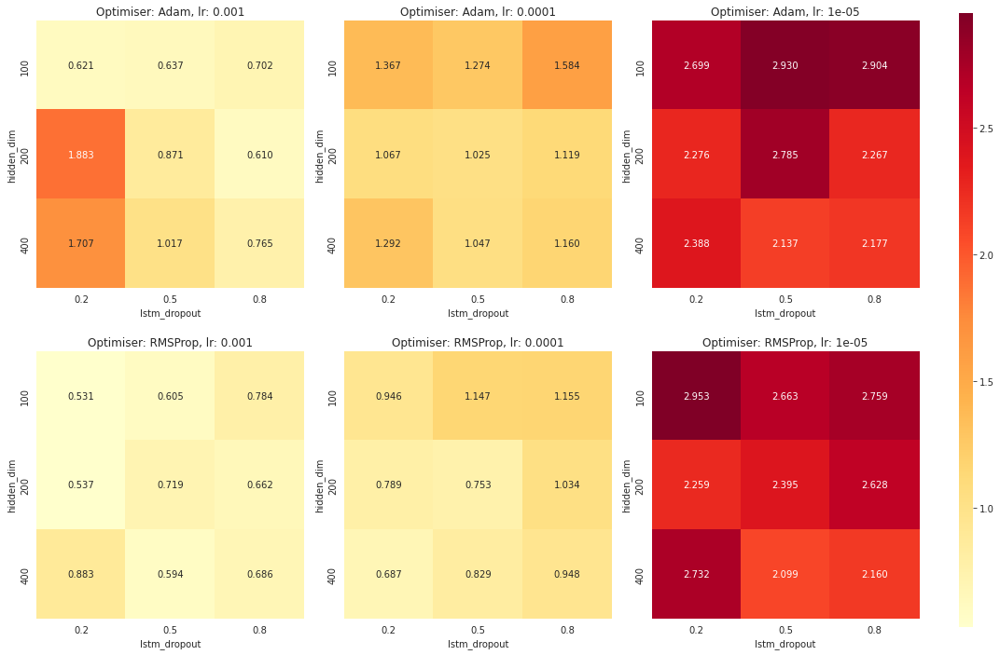




forecast_bias


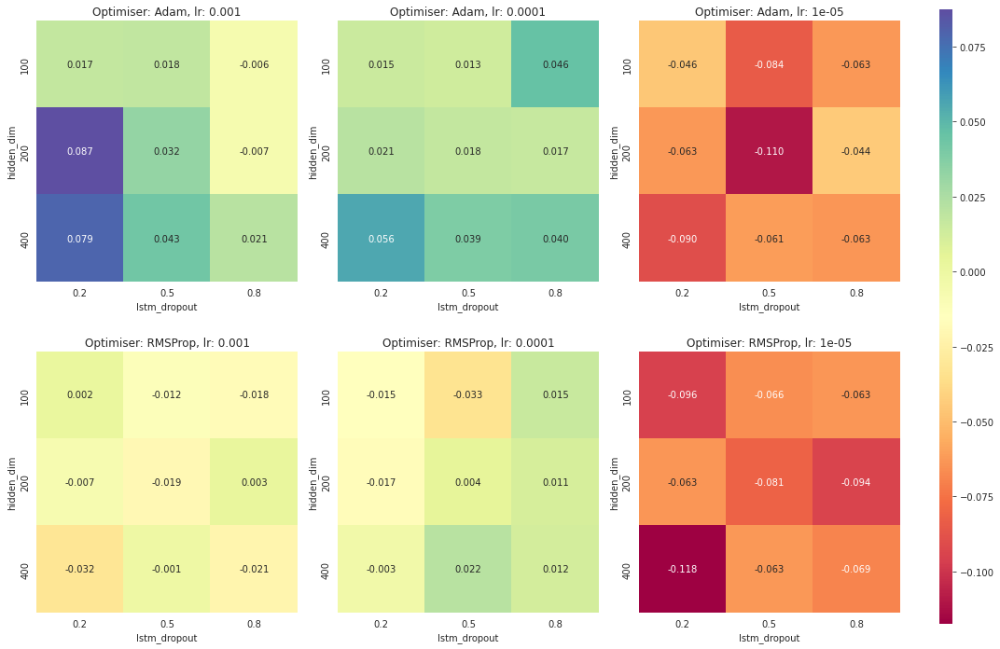




computation_time


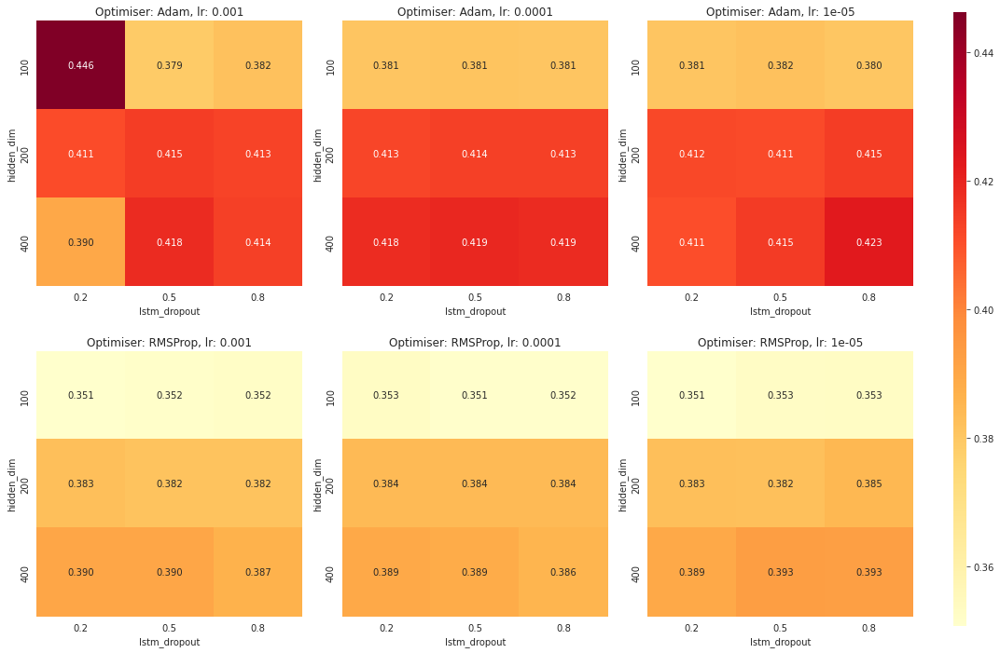

In [22]:
print(f"\n\n== Heatmaps ==\n")

df_hm = pd.DataFrame(columns=["hidden_dim", "lstm_dropout", "optimiser", "lr", "test_loss", "mase", "forecast_bias", "computation_time"])

for experiment in experiment_results.values():
    df_hm = df_hm.append({
        "hidden_dim": experiment["hidden_dim"],
        "lstm_dropout": experiment["lstm_dropout"],
        "optimiser": experiment["optimiser"],
        "lr": experiment["lr"],
        "test_loss": experiment["test_loss"],
        "mase": experiment["mase"],
        "forecast_bias": experiment["forecast_bias"],
        "computation_time": experiment["computation_time"]
    }, ignore_index=True)

unique_optimisers = df_hm["optimiser"].unique()
unique_lrs = df_hm["lr"].unique()

from matplotlib import gridspec

for metric_name in ["test_loss", "mase", "forecast_bias", "computation_time"]:
    print(f"{metric_name}")

    # Setting min and max for colour normalisation:
    vmin = df_hm[metric_name].min()
    vmax = df_hm[metric_name].max()

    fig = plt.figure(figsize=(15, 10))
    spec = gridspec.GridSpec(nrows=len(unique_optimisers), ncols=len(unique_lrs) + 1, width_ratios=[1] * len(unique_lrs) + [0.05])

    cbar_ax = fig.add_subplot(spec[:, -1])  # Colour bar axis setup.

    for i, optimiser in enumerate(unique_optimisers):
        for j, lr in enumerate(unique_lrs):
            subset = df_hm[(df_hm["optimiser"] == optimiser) & (df_hm["lr"] == lr)]

            if not subset.empty:
                result = subset.pivot("hidden_dim", "lstm_dropout", metric_name)

                if metric_name == "forecast_bias":
                    cmap_choice = "Spectral"
                else:
                    cmap_choice = "YlOrRd"
                
                ax = fig.add_subplot(spec[i, j])
                sns.heatmap(result, annot=result, fmt=".3f", cmap=cmap_choice, ax=ax, vmin=vmin, vmax=vmax, cbar=i==0 and j==0, cbar_ax=cbar_ax if i==0 and j==0 else None)
                title = f"Optimiser: {optimiser}, lr: {lr}"
                ax.set_title(title)

                # Ensuring square cells:
                ax.set_aspect('equal', 'box')

    plt.tight_layout()
    plt.show()
    print("\n\n")


<h3>Plotting Graphs for Best Experiments</h3>

Best experiment id's: [1971, 2007, 2016, 1983, 2009, 1989]



Plots for Experiment 1971


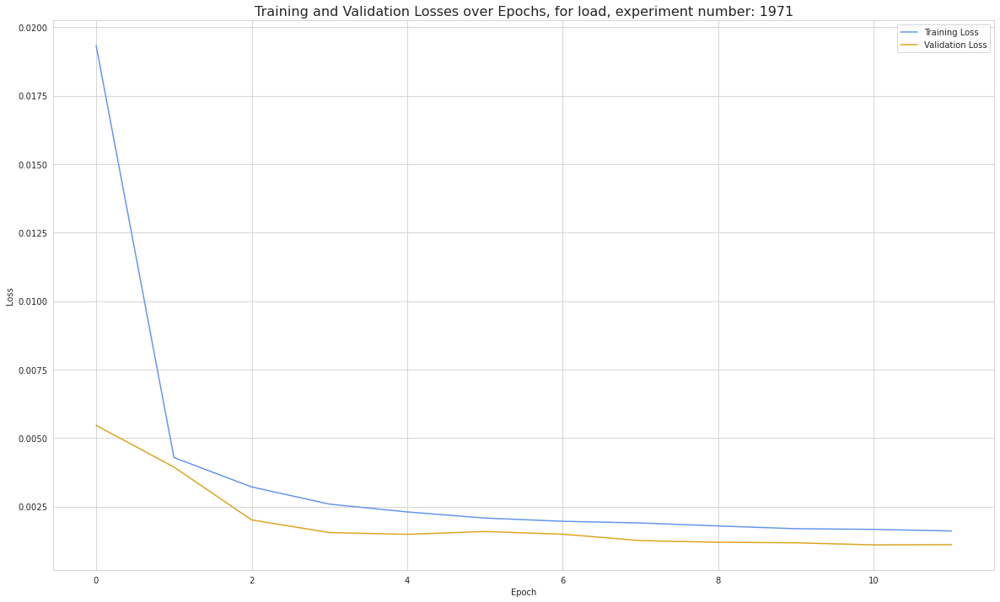

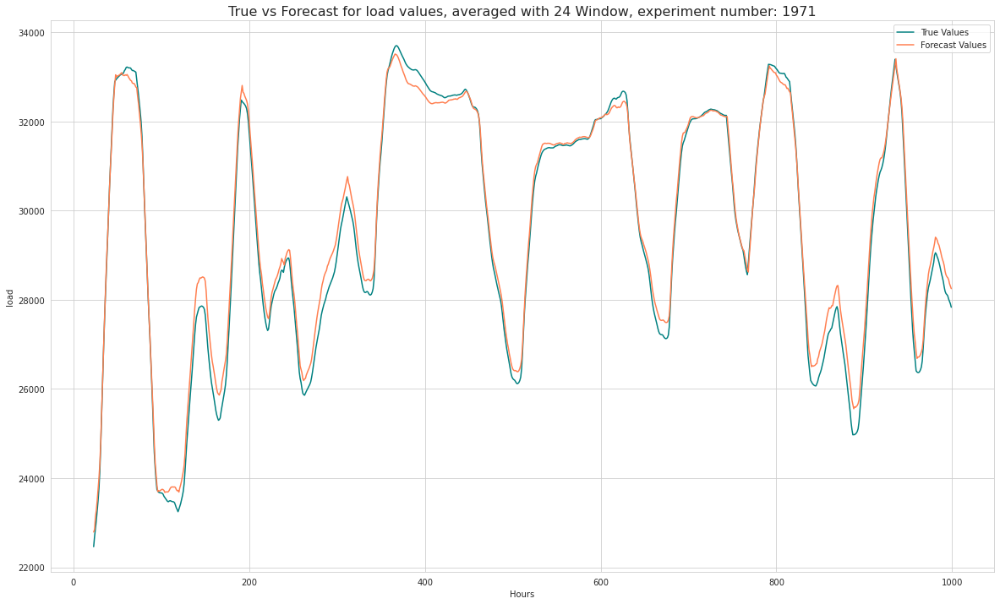

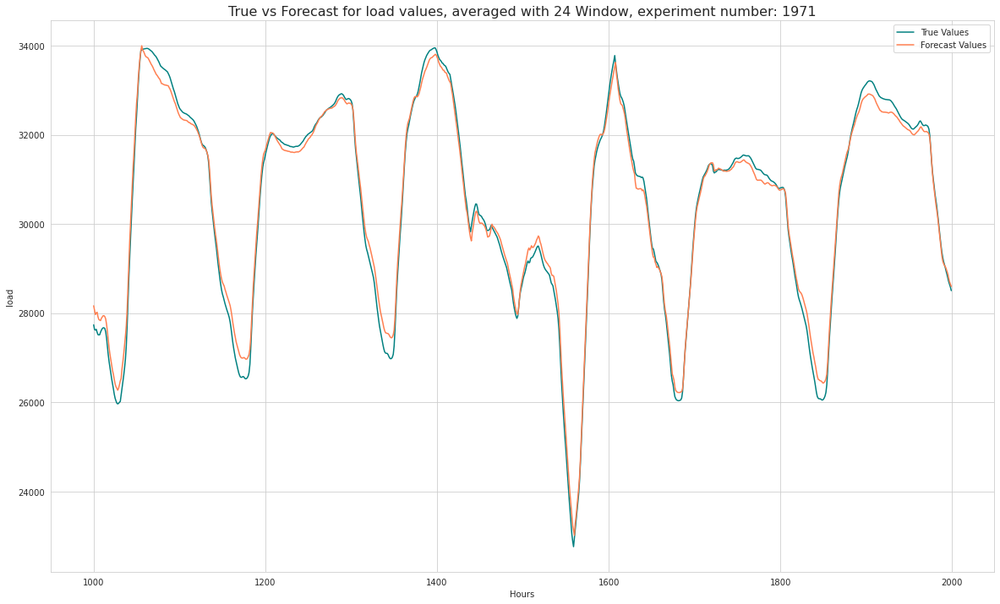

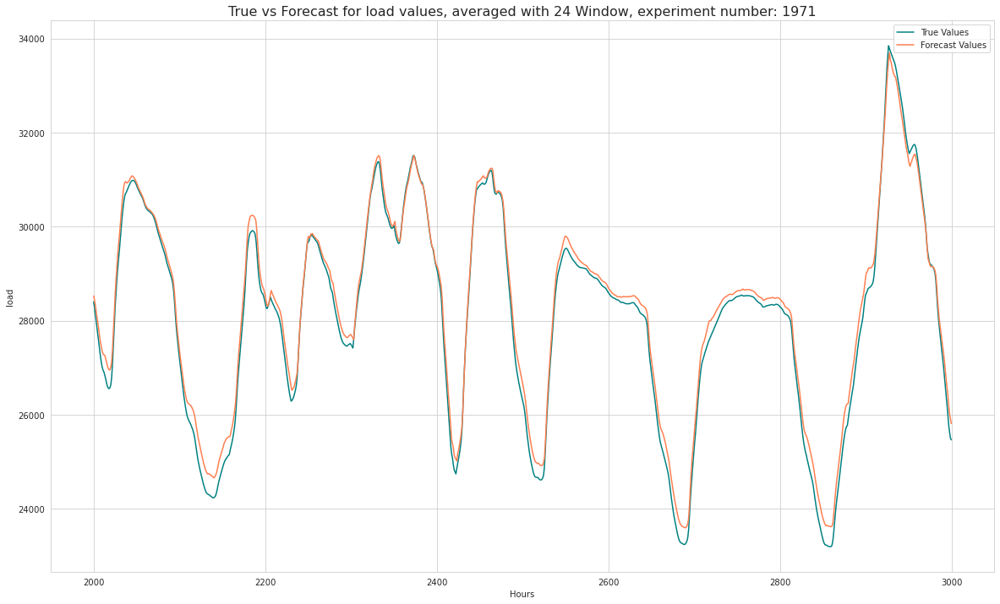

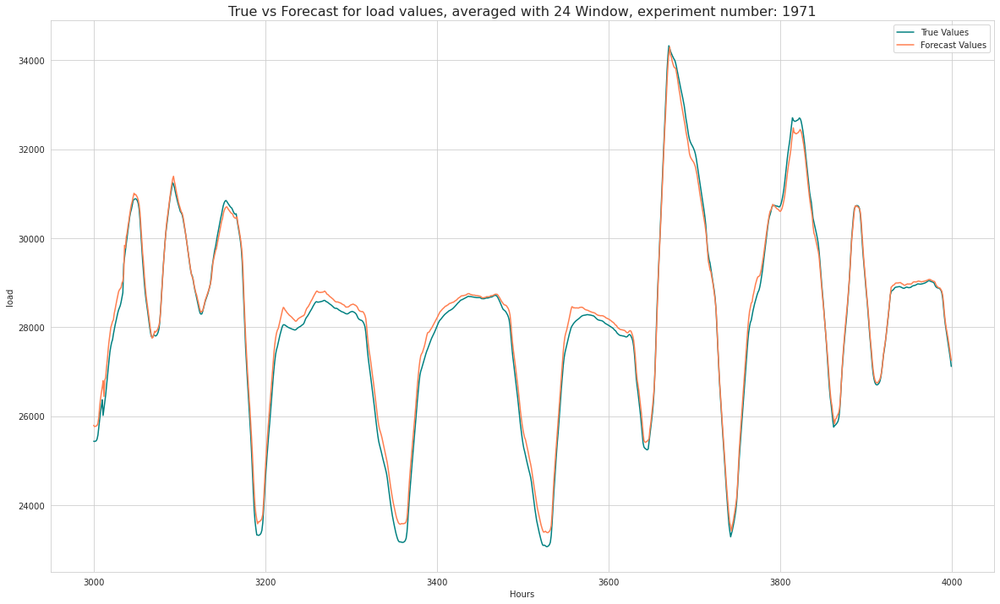

...

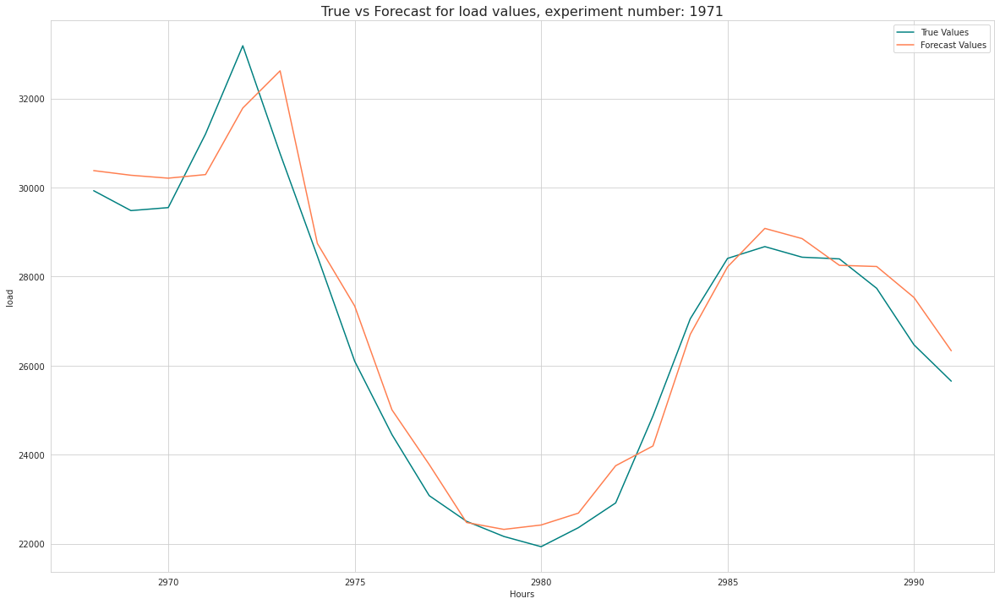

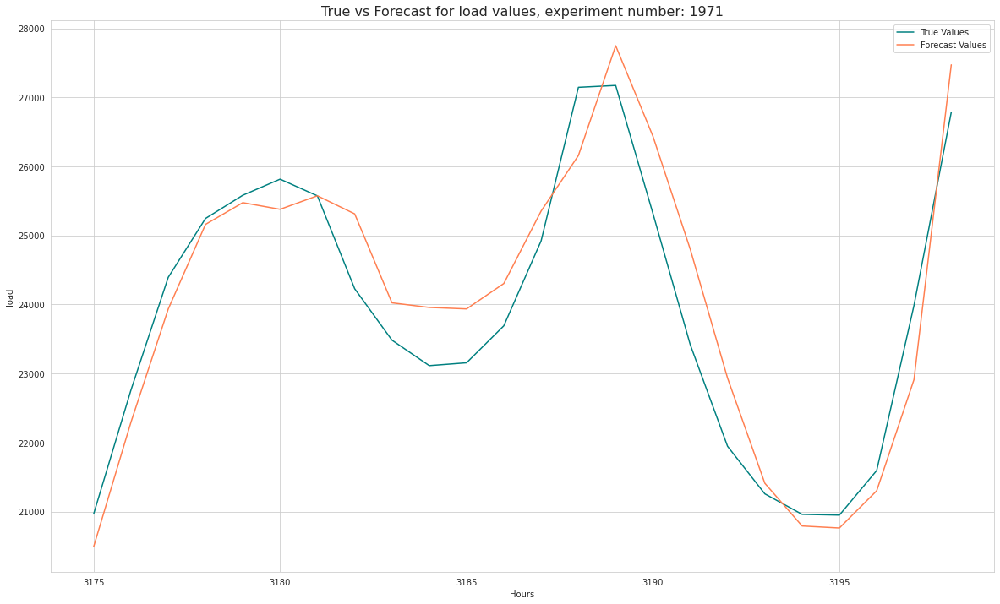

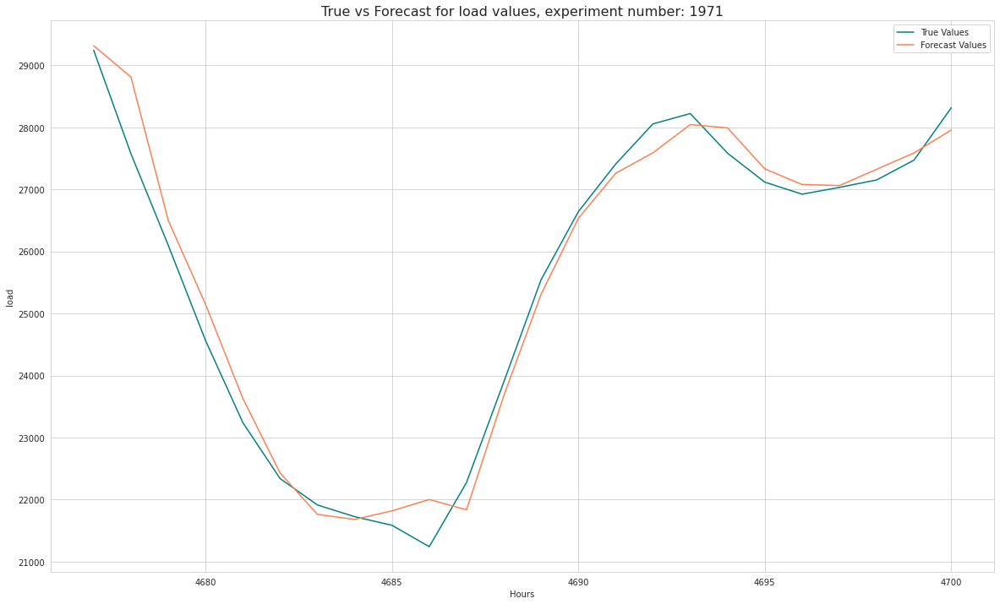

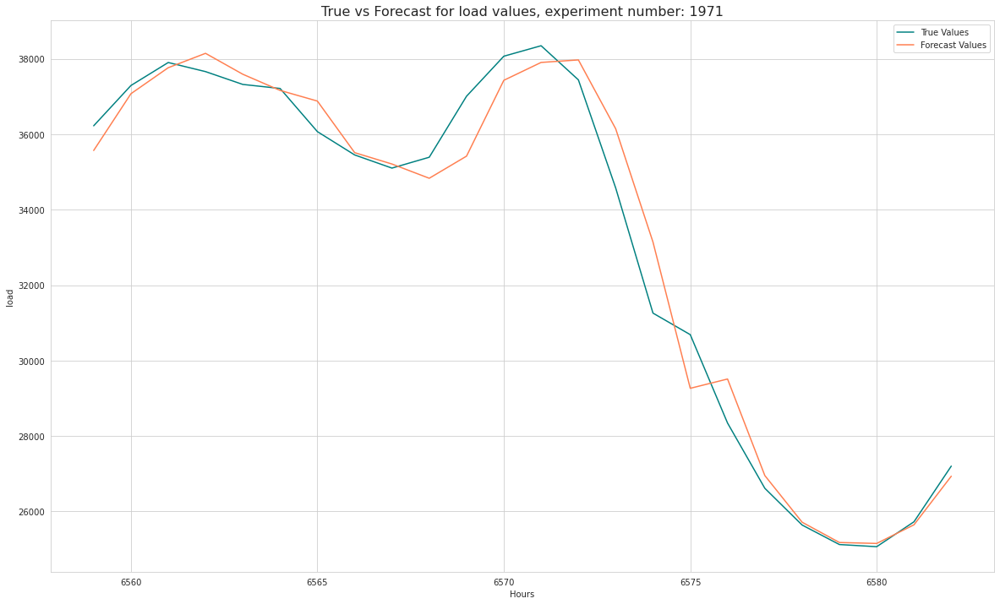

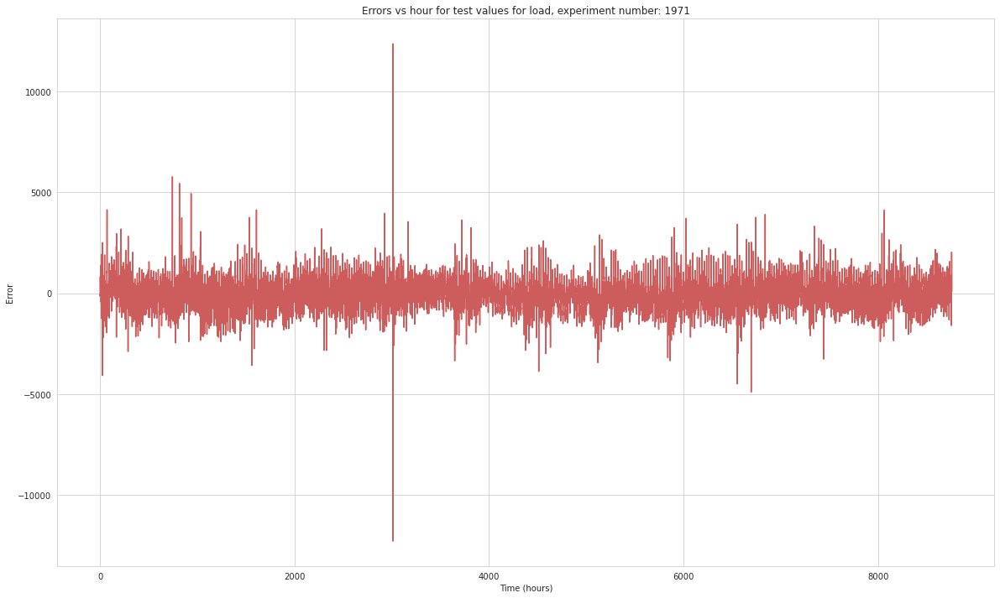




Plots for Experiment 2007


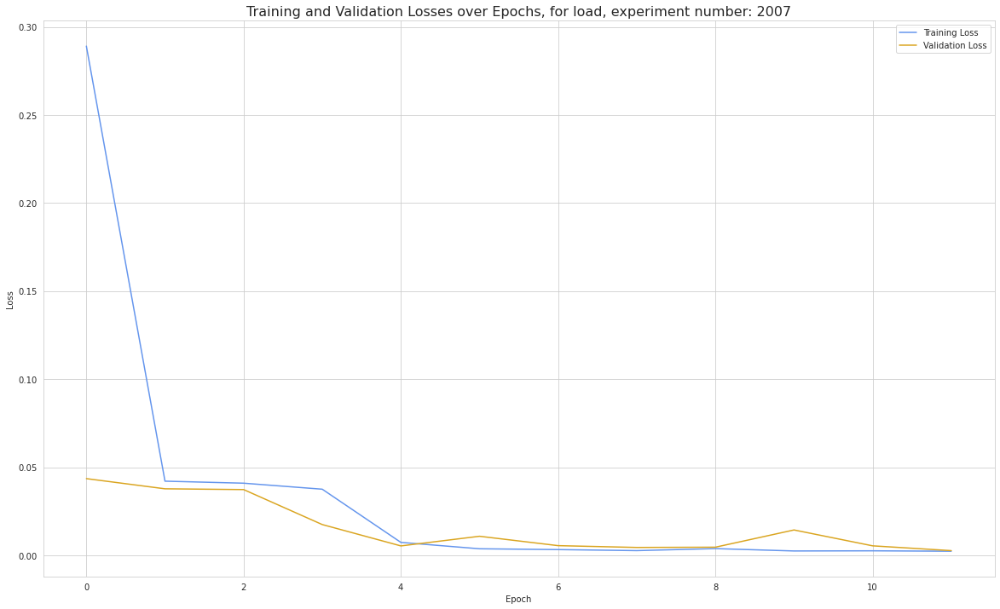

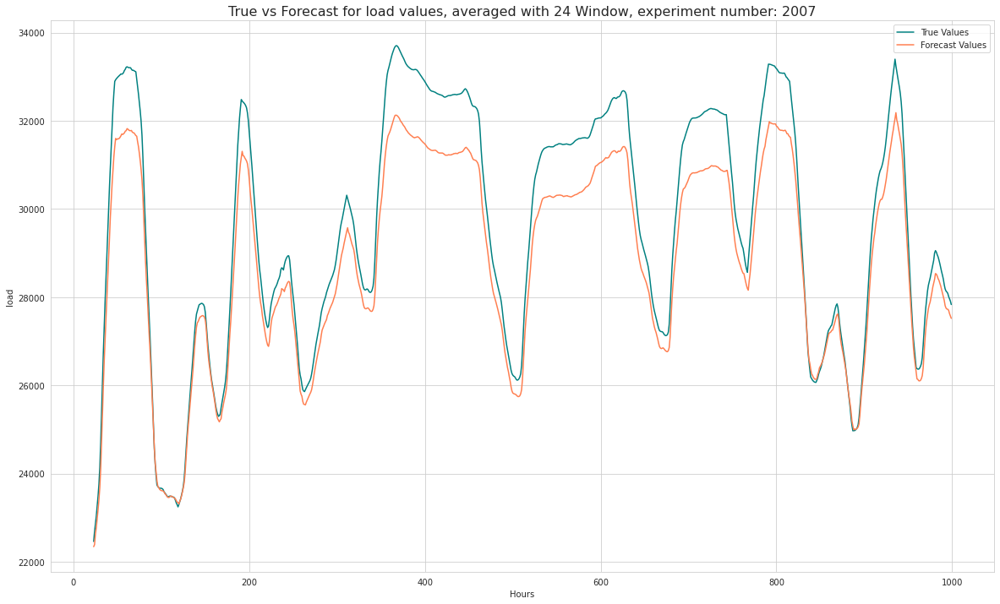

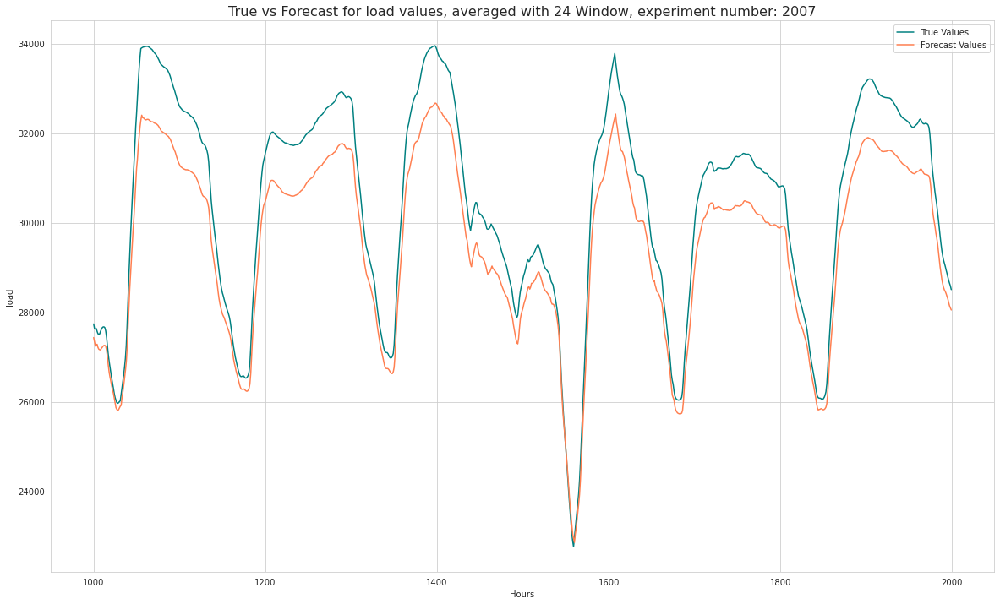

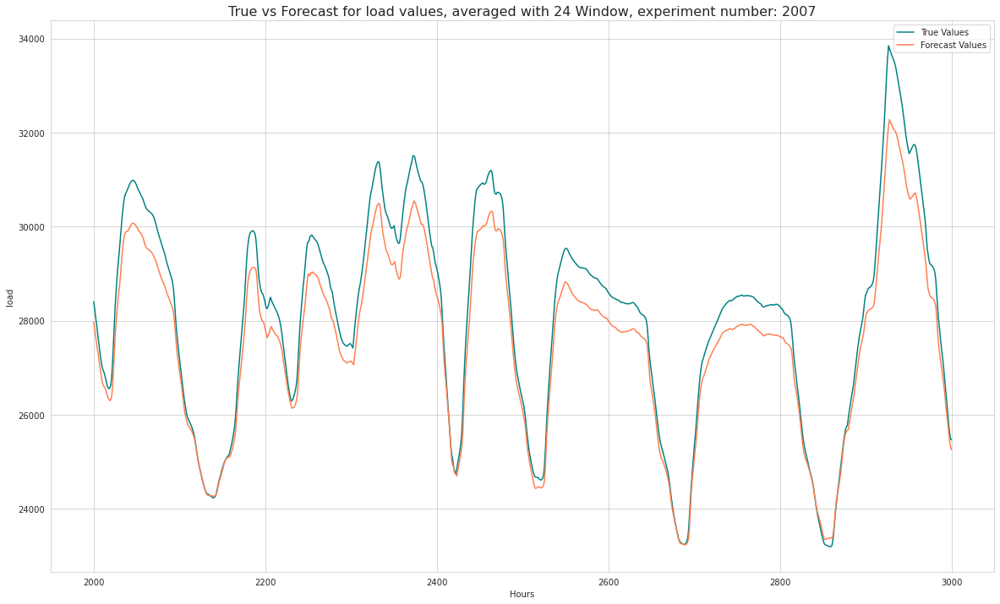

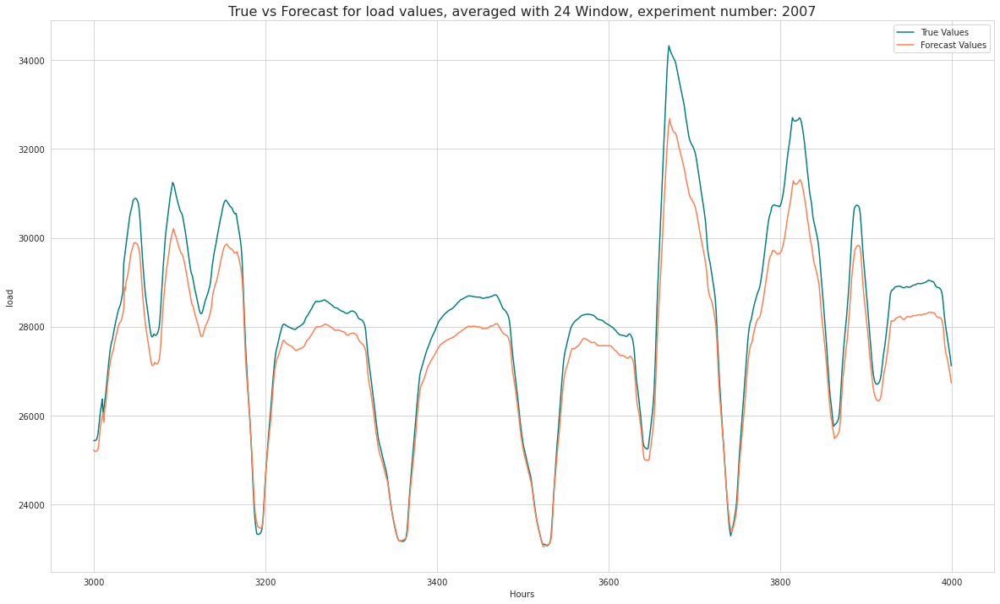

...

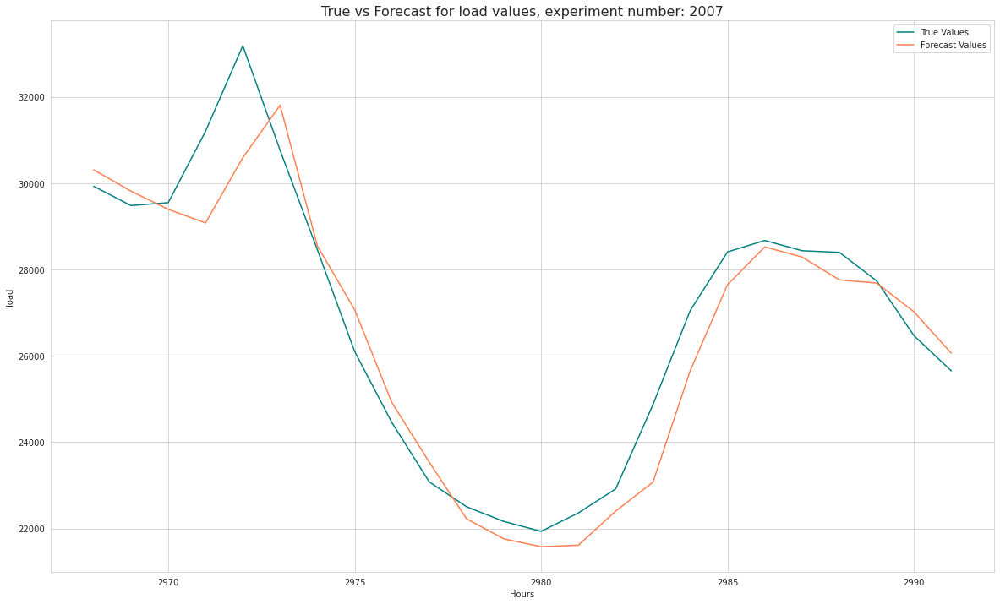

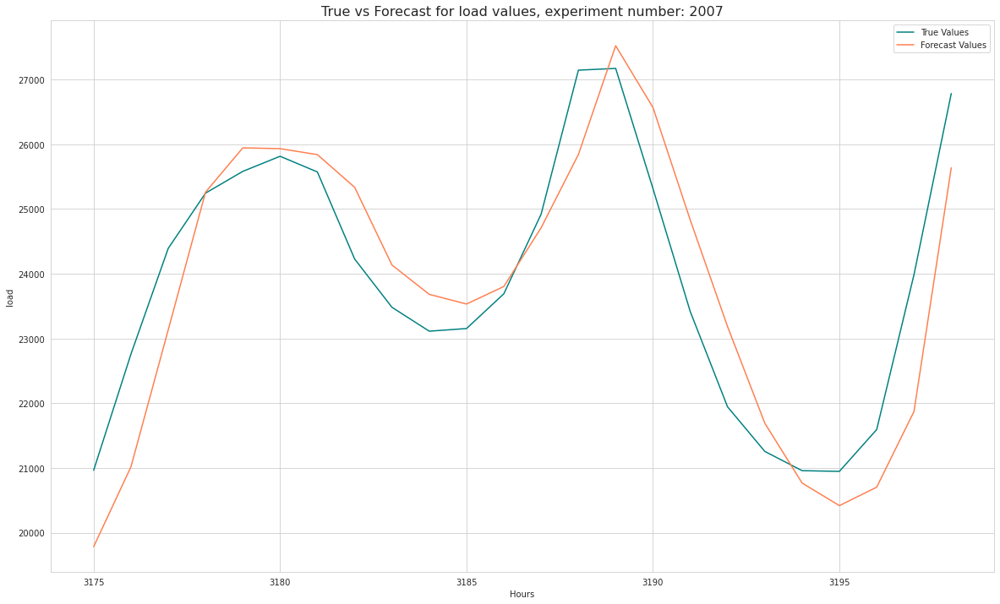

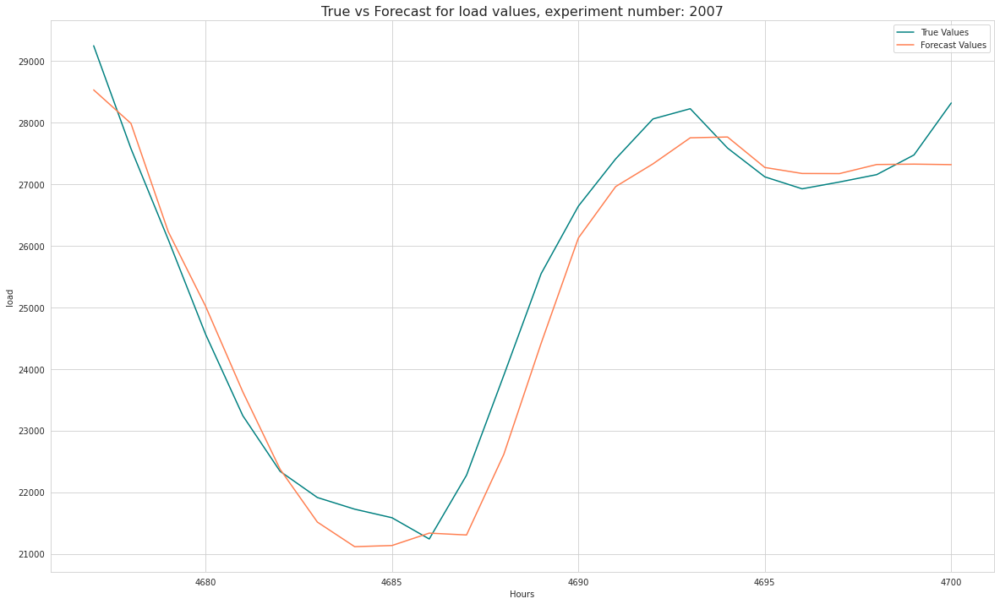

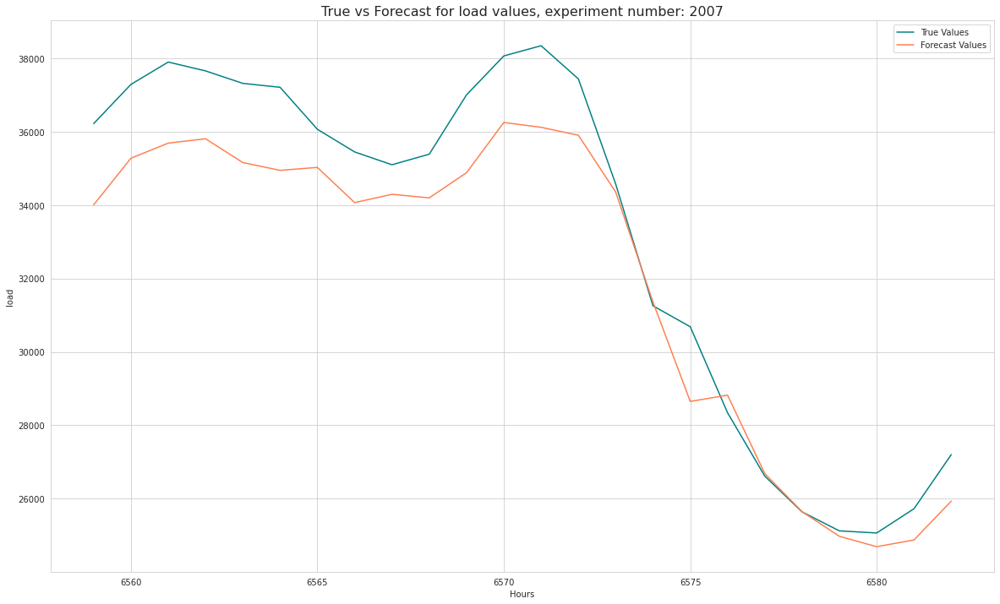

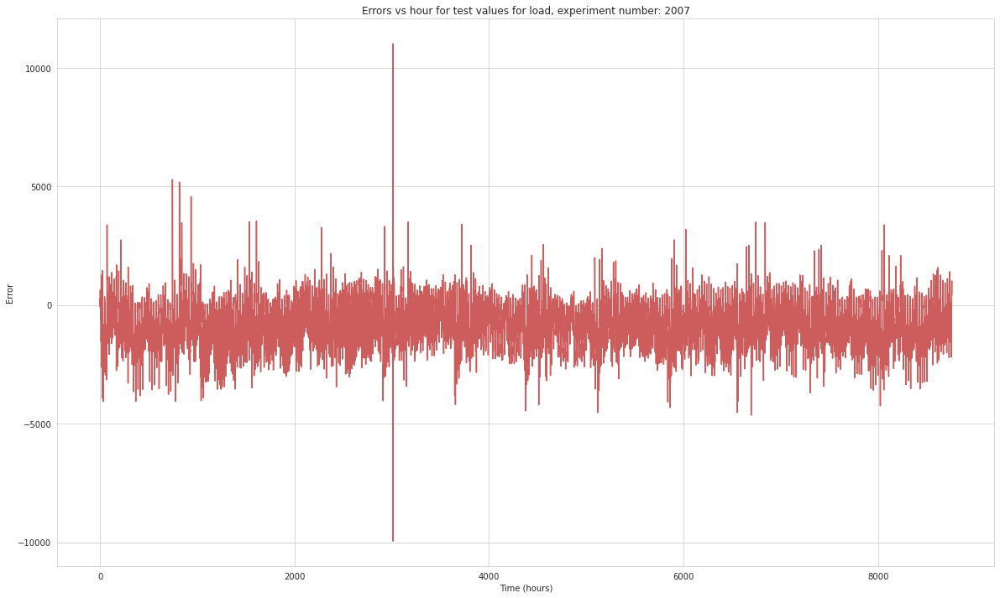




Plots for Experiment 2016


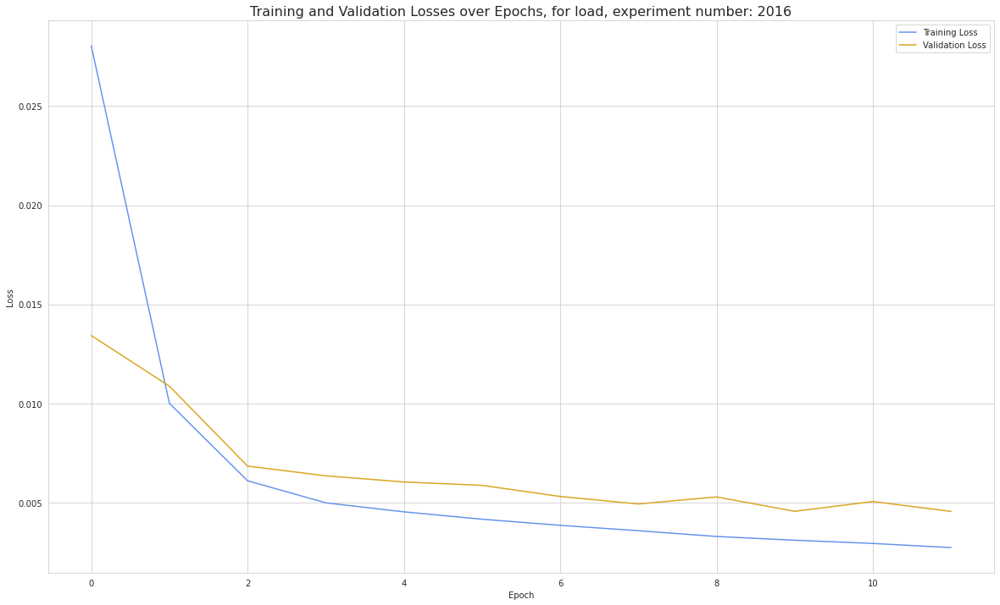

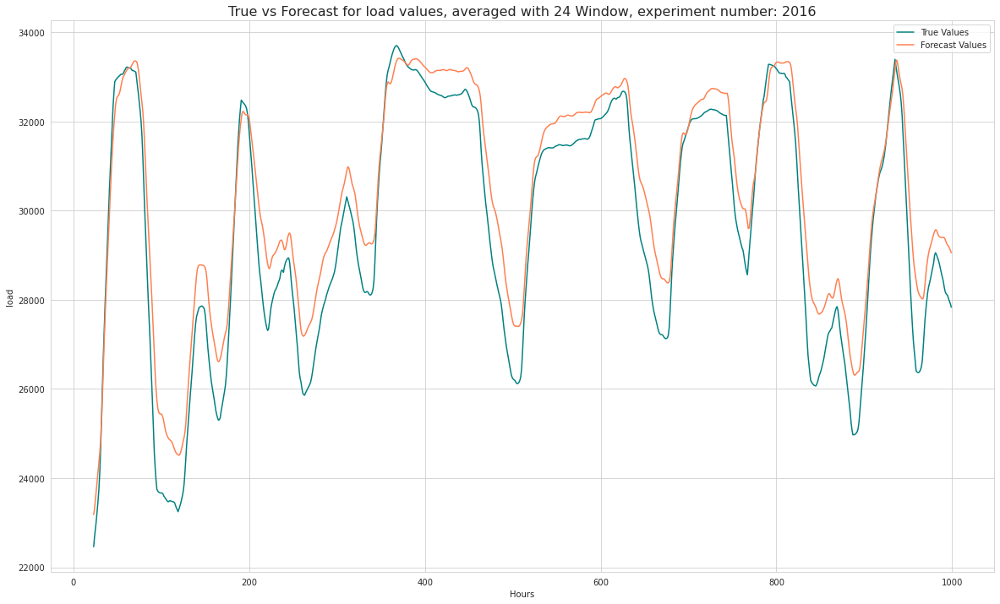

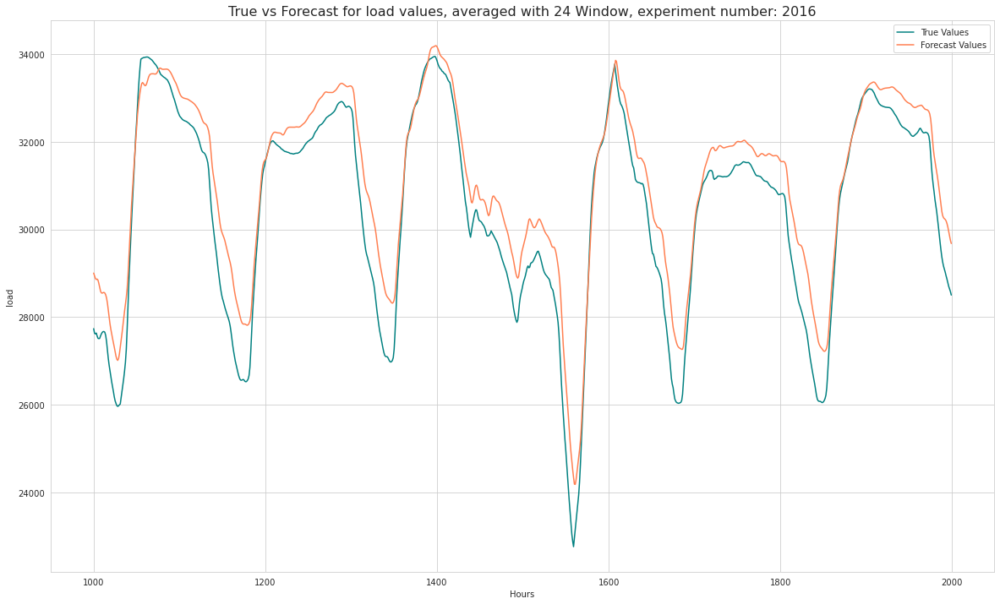

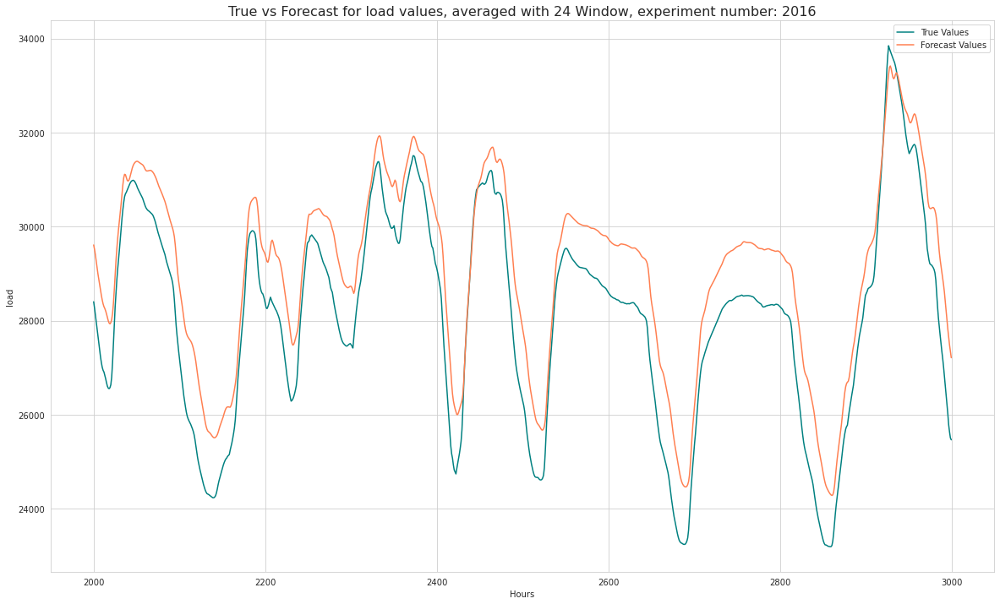

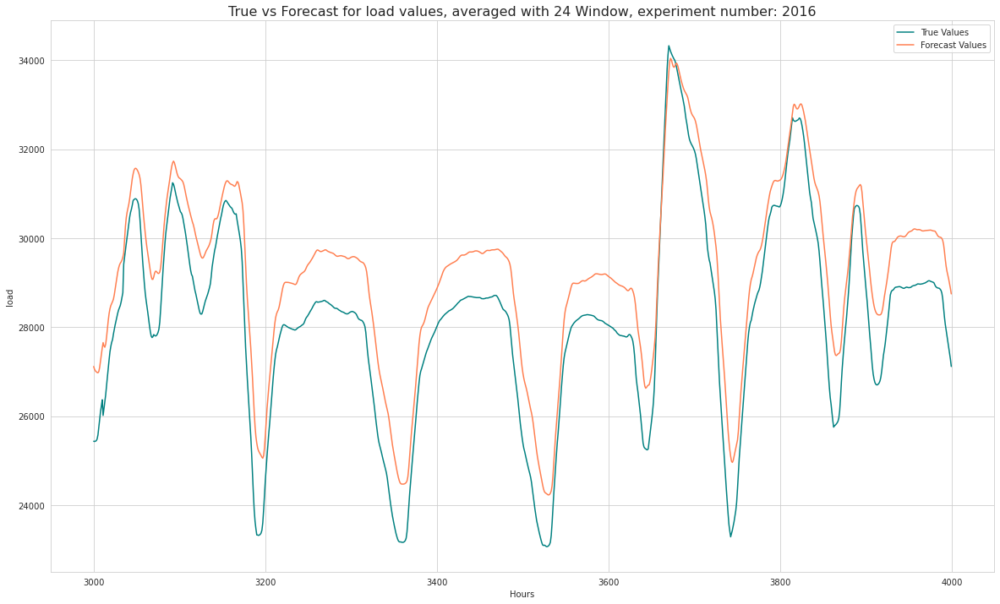

...

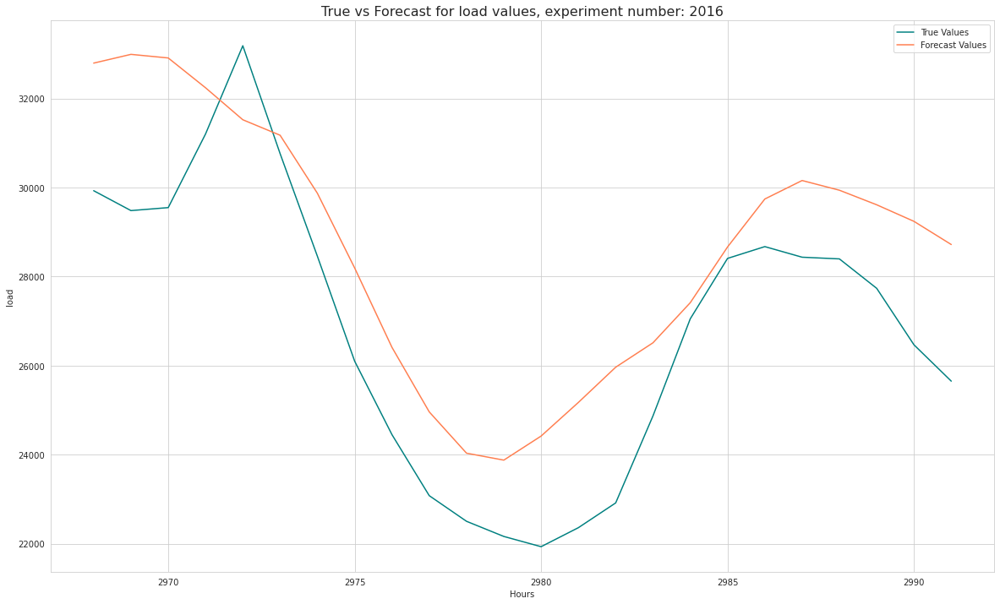

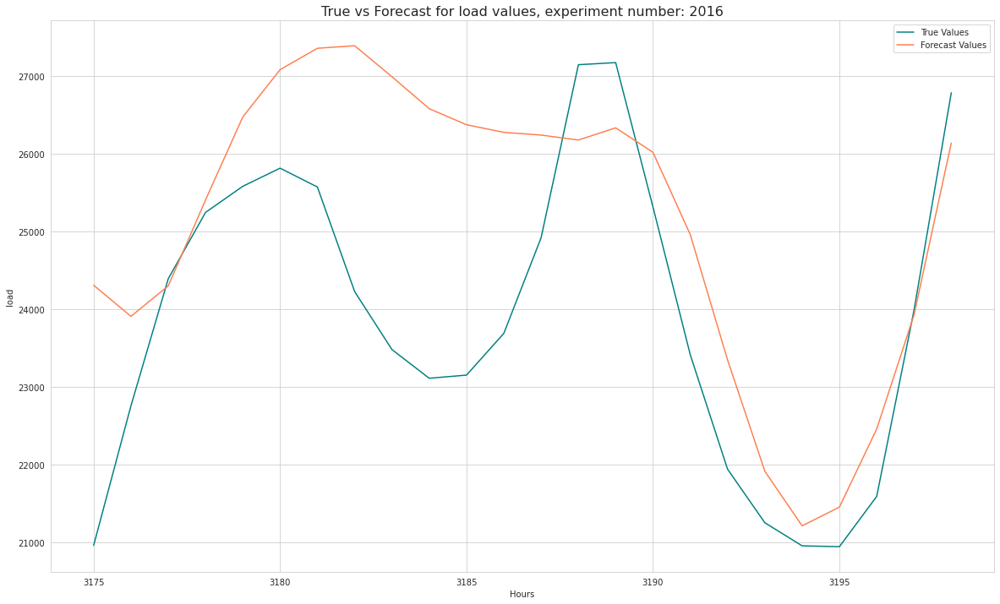

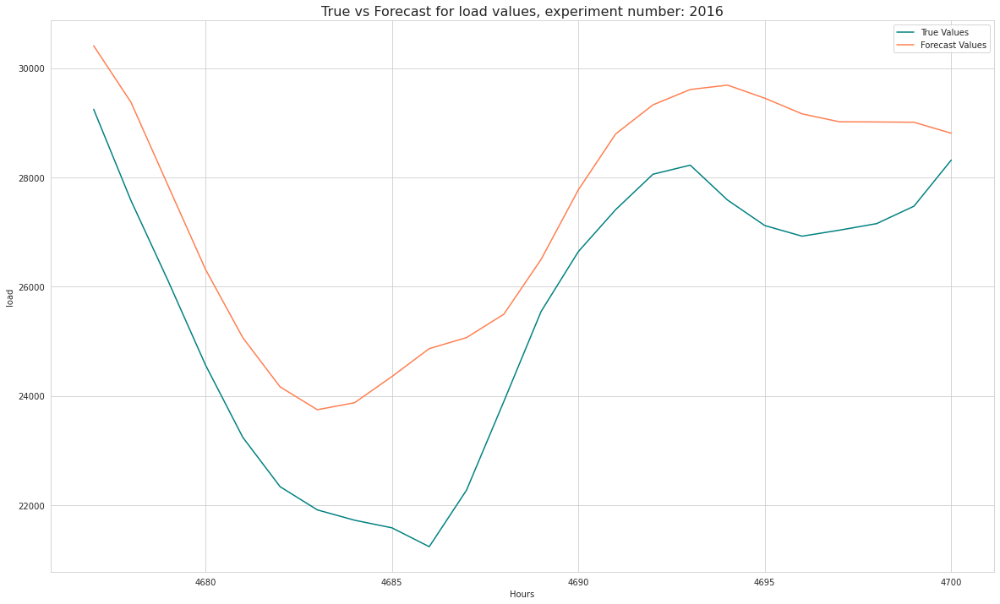

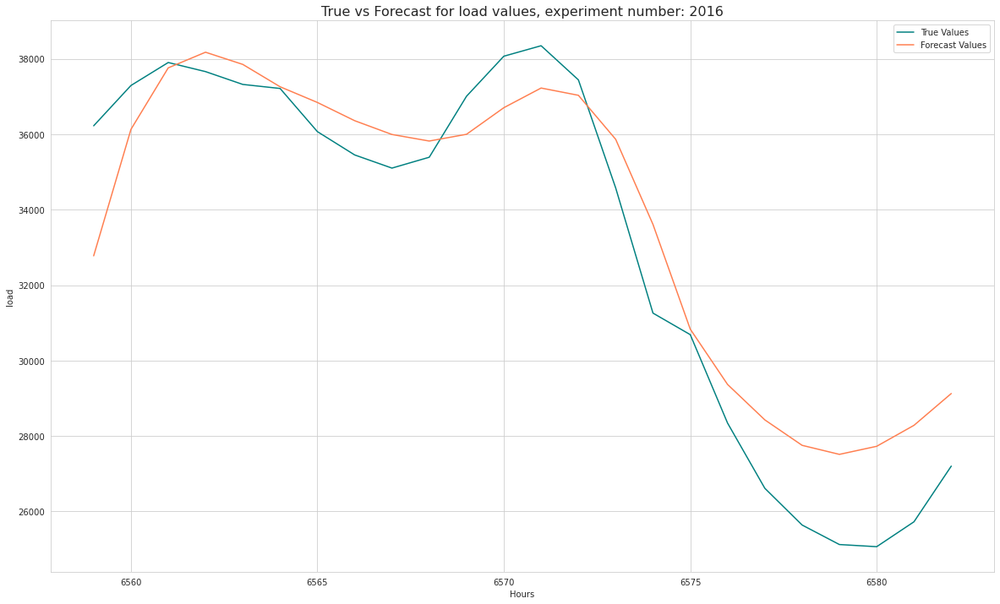

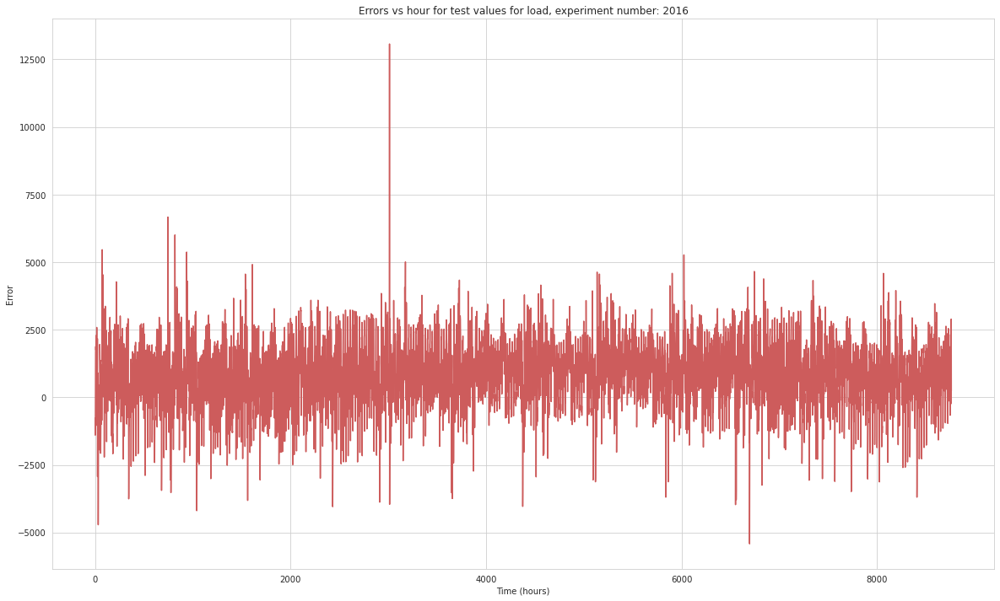




Plots for Experiment 1983


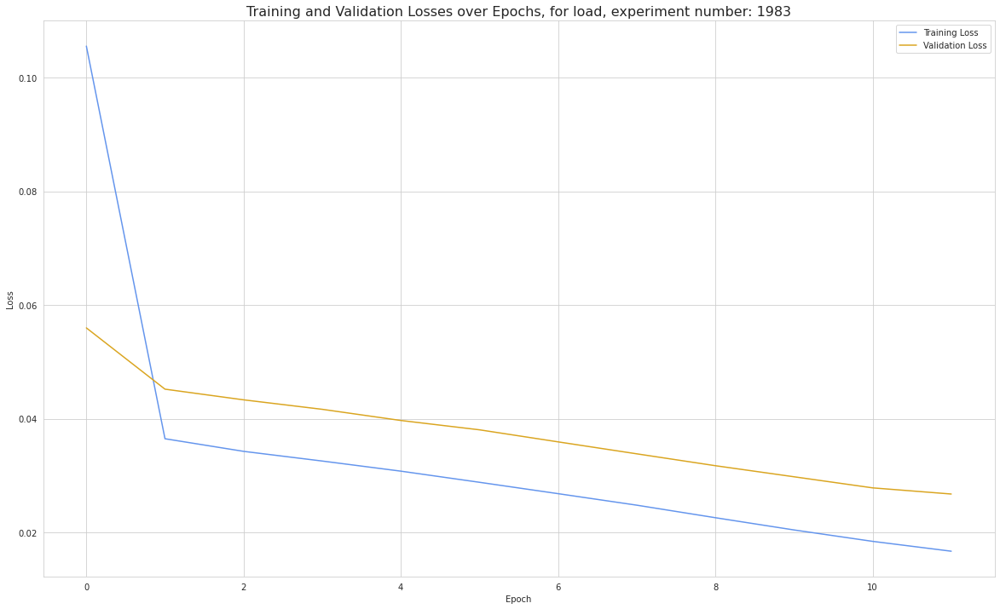

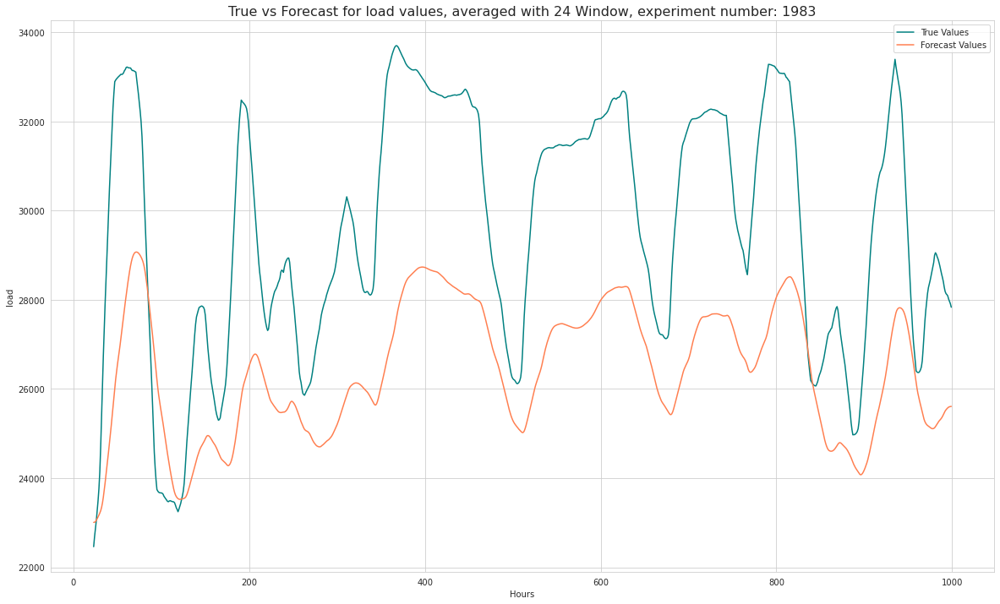

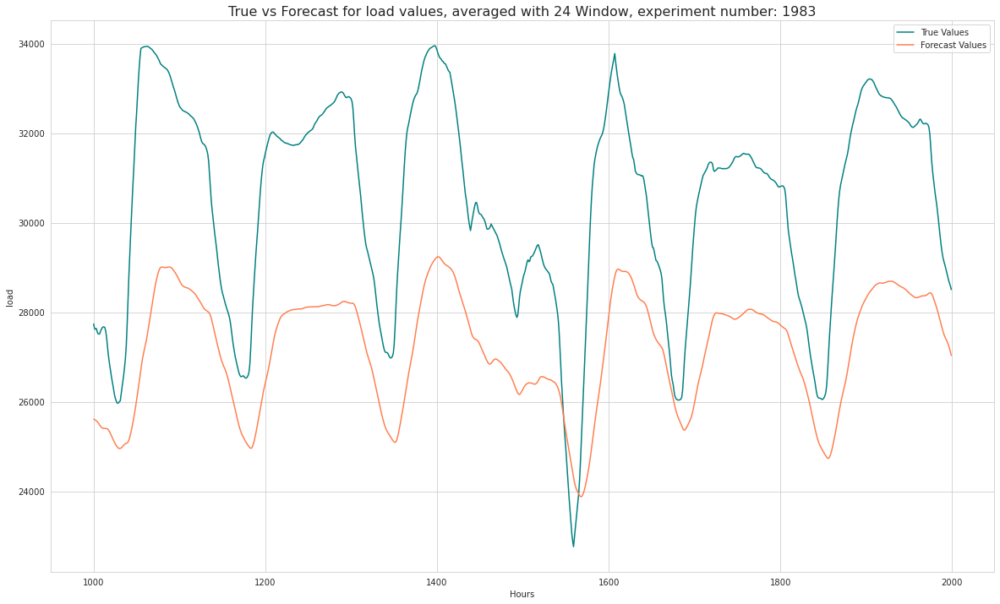

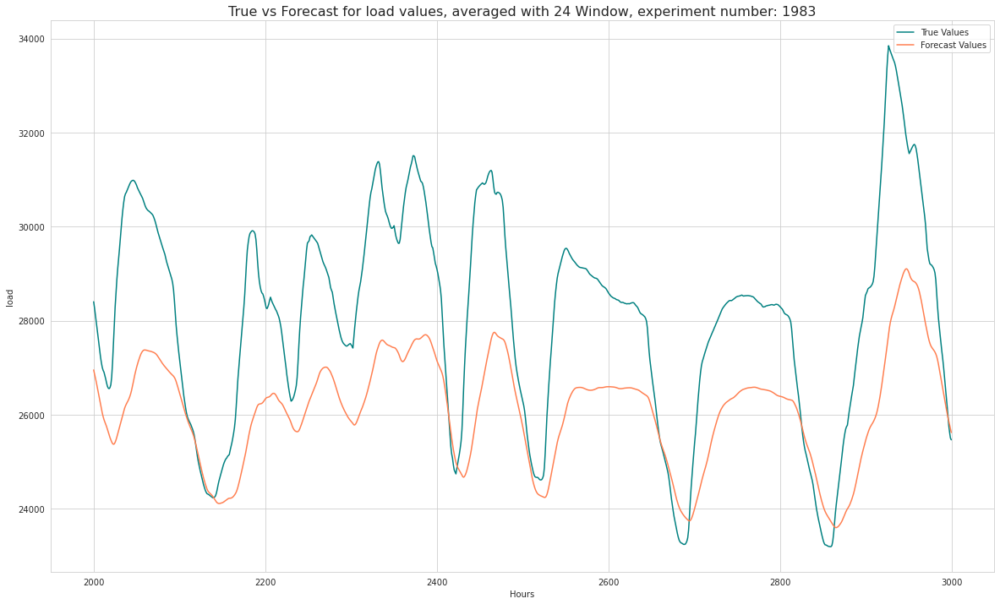

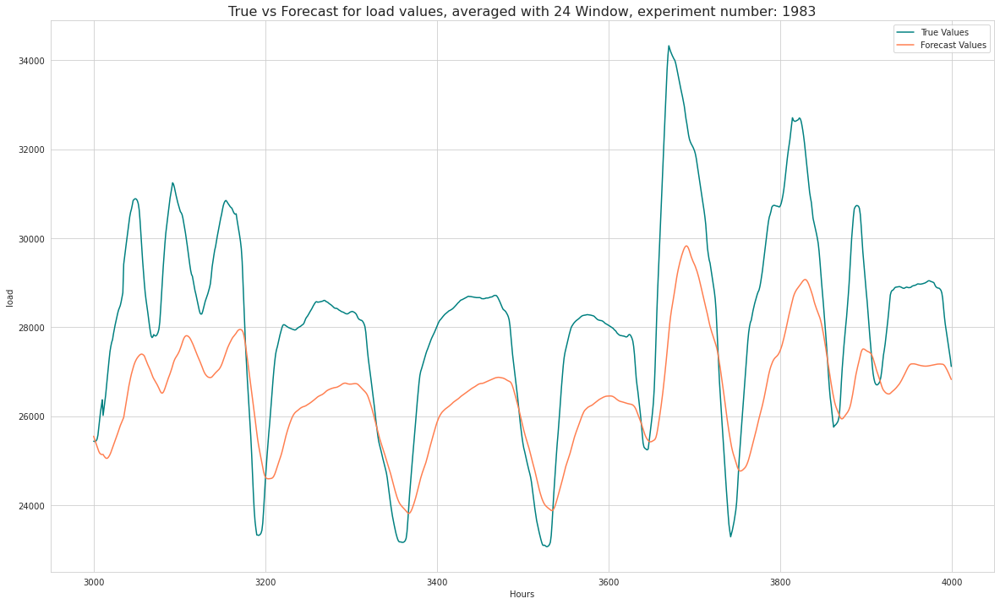

...

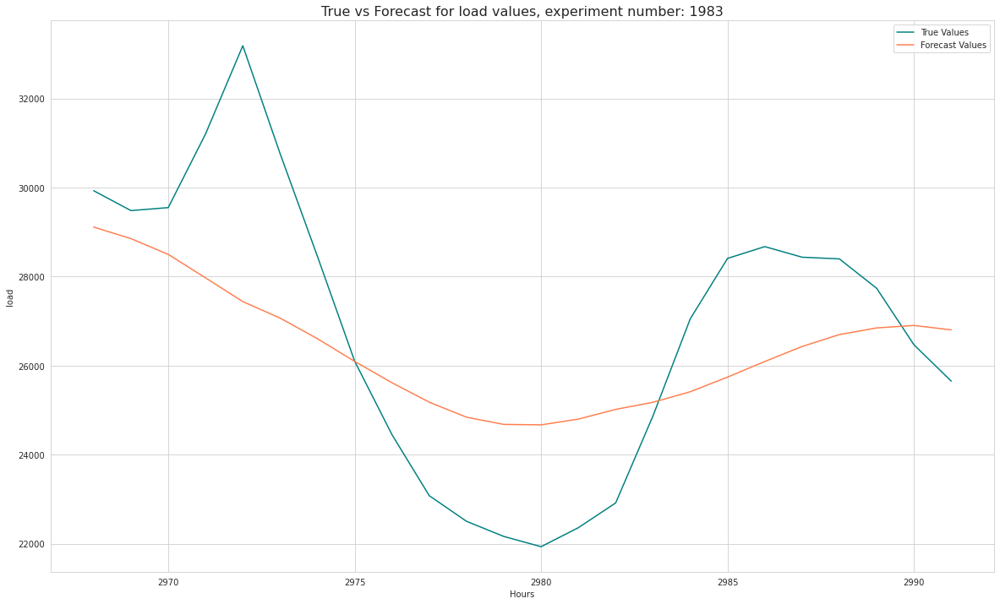

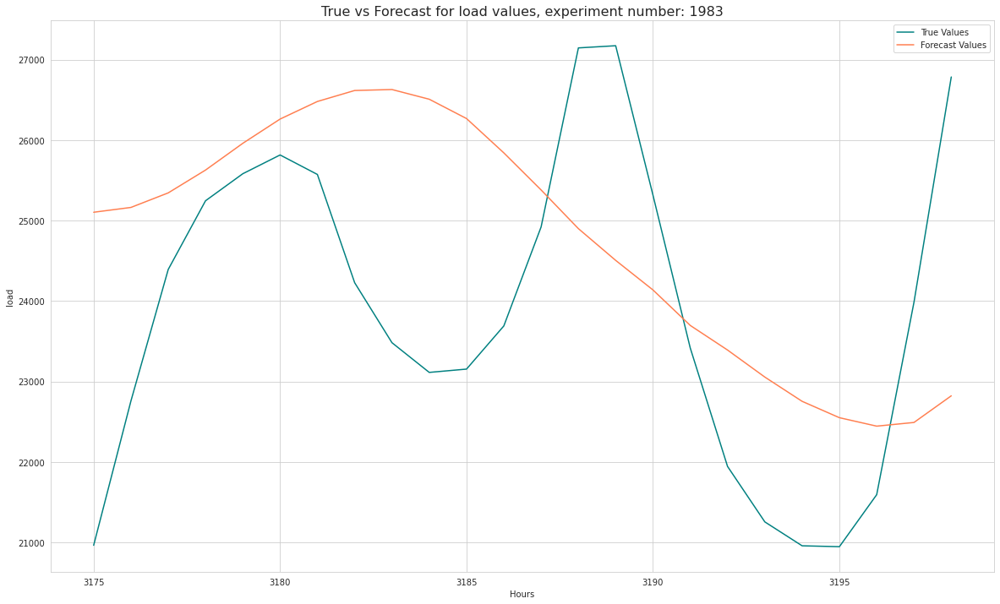

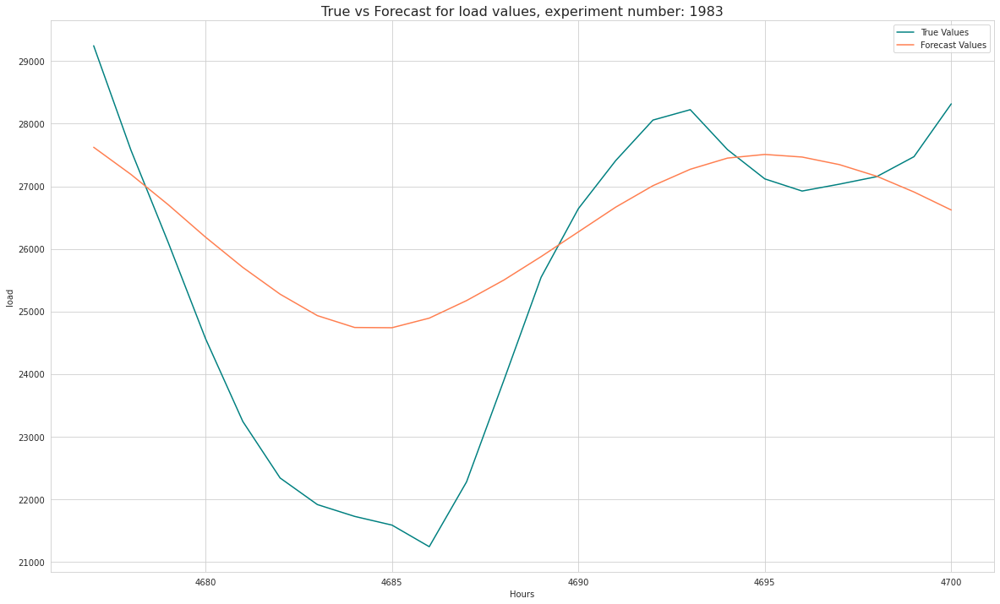

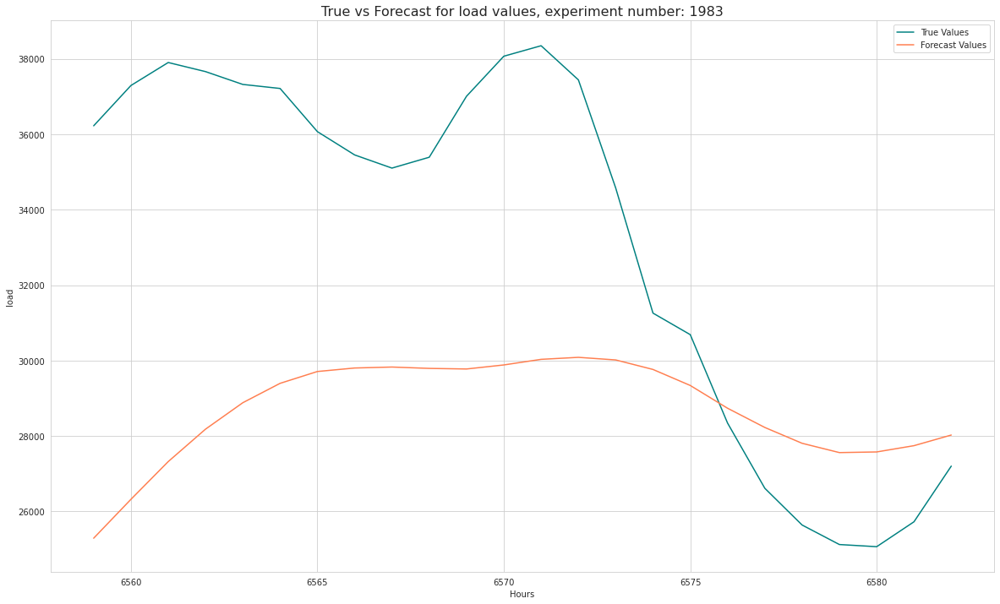

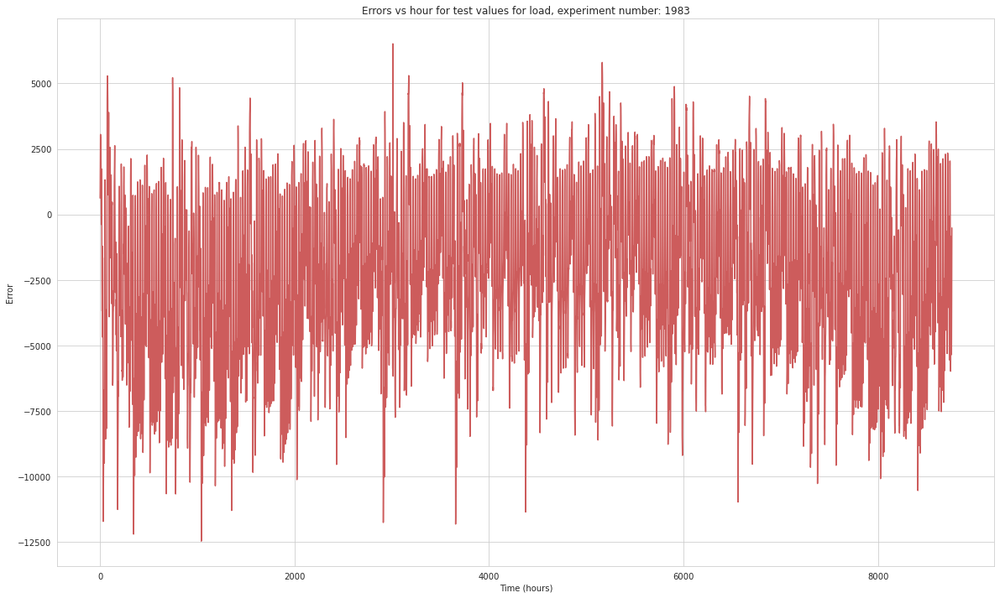




Plots for Experiment 2009


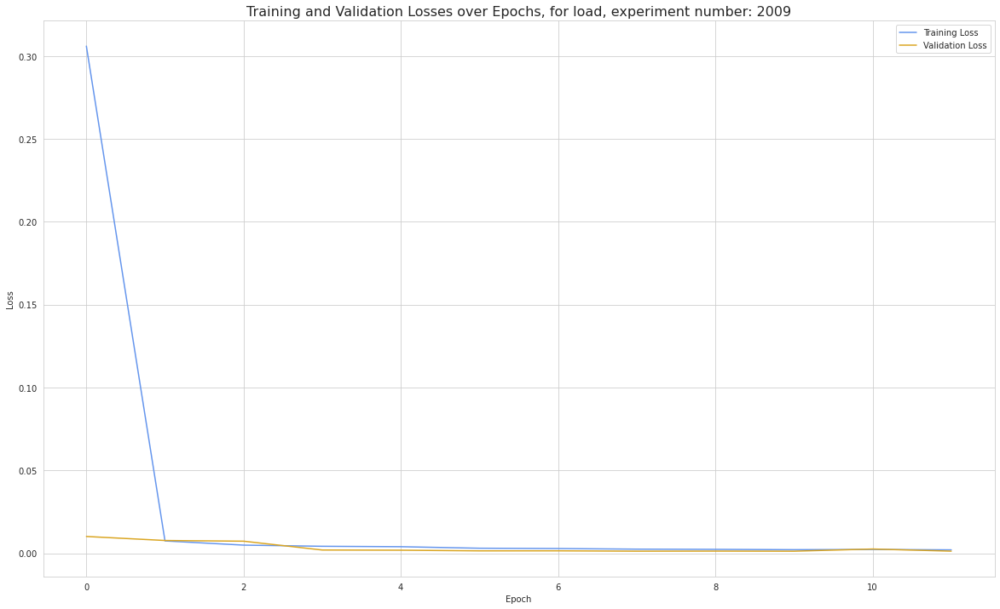

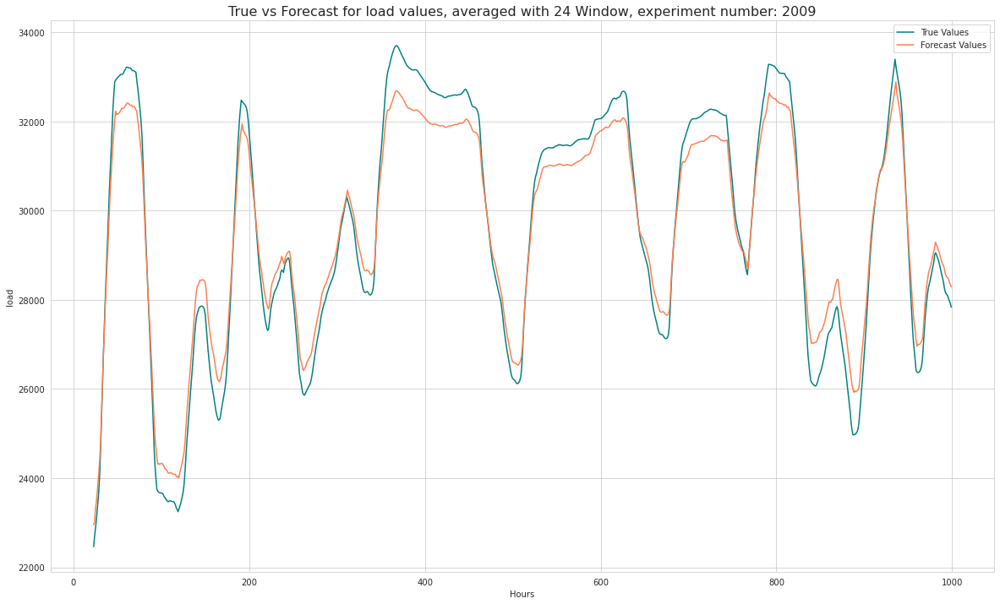

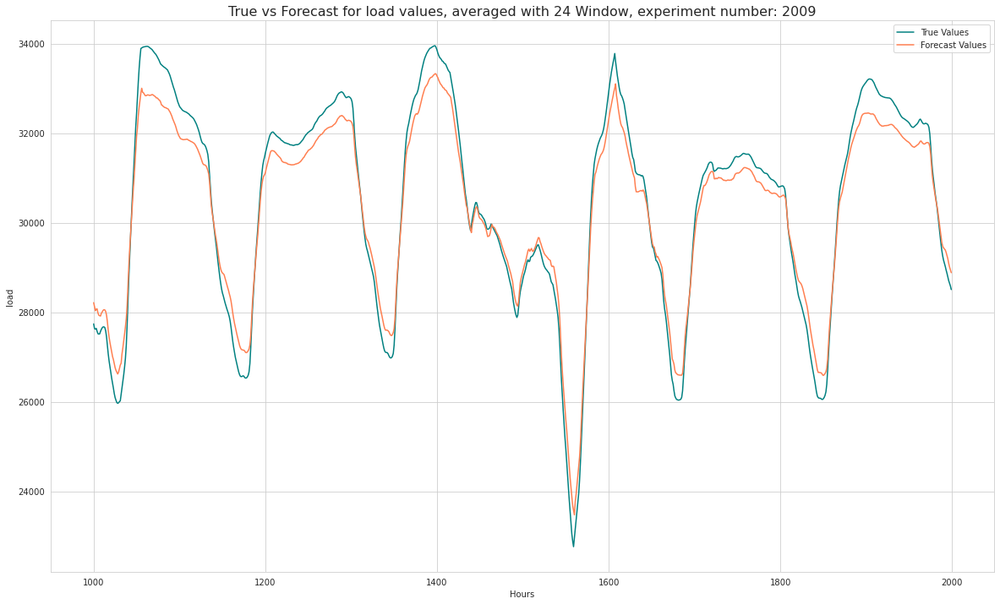

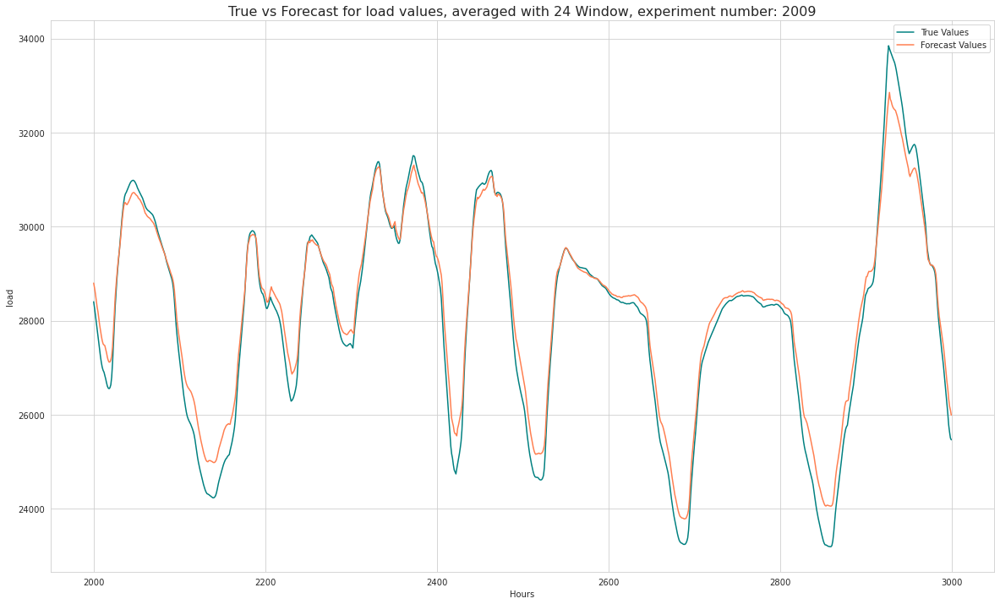

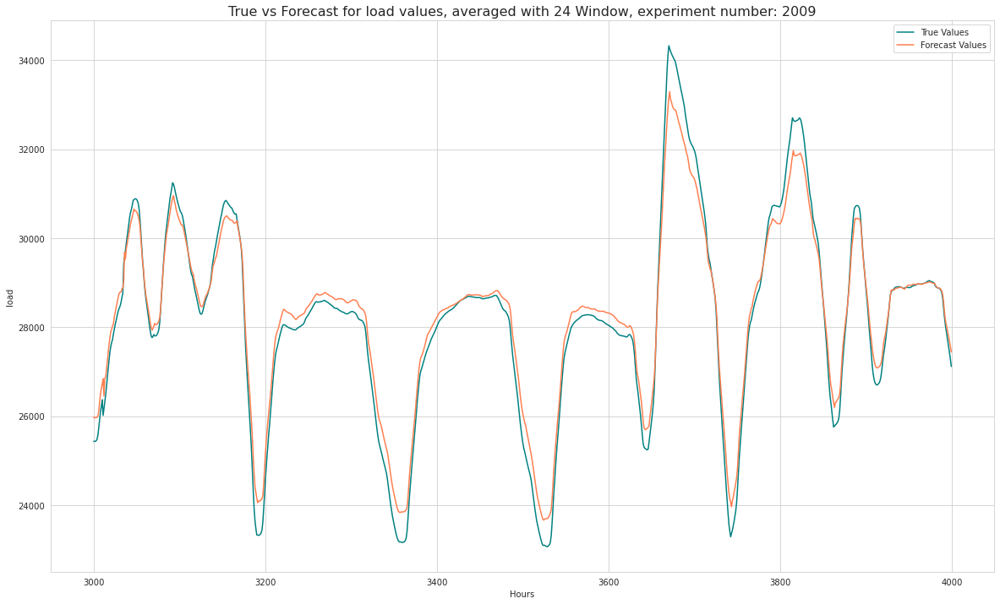

...

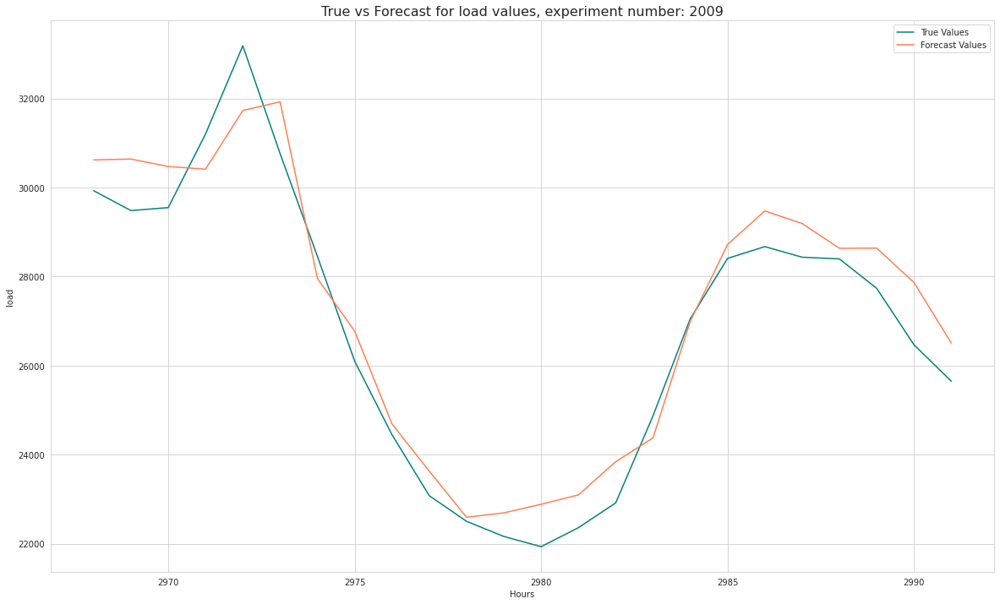

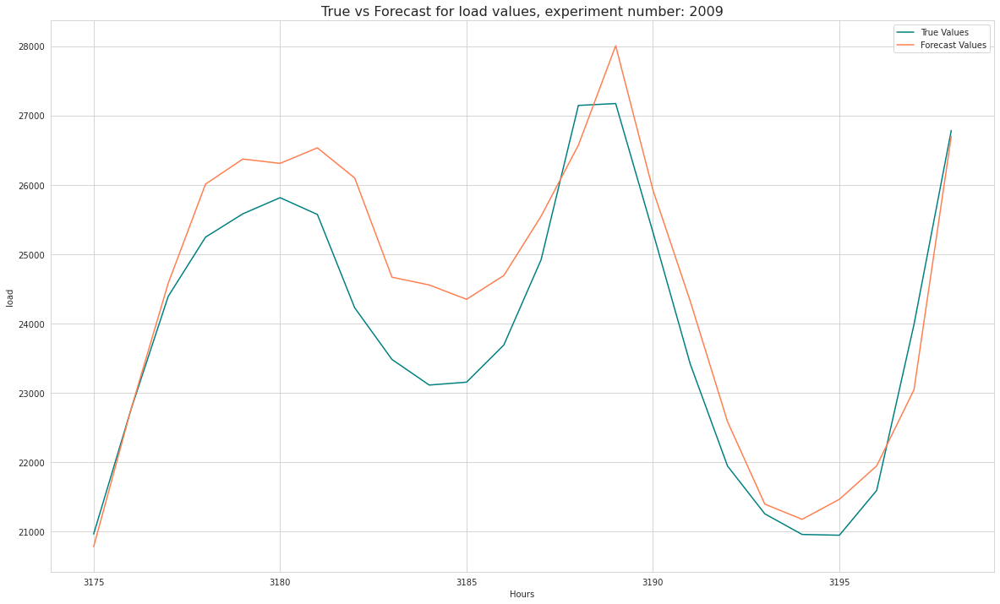

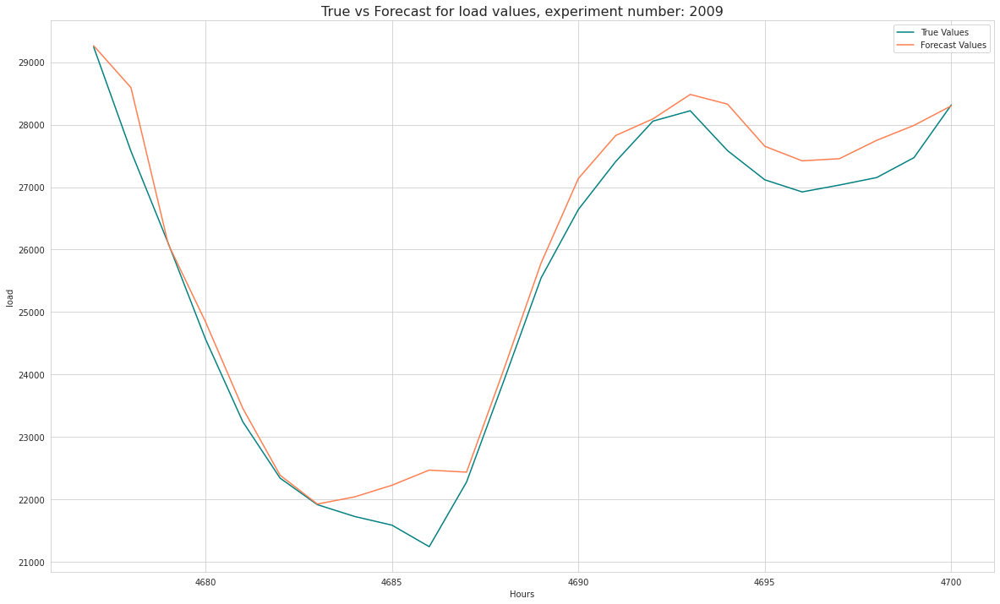

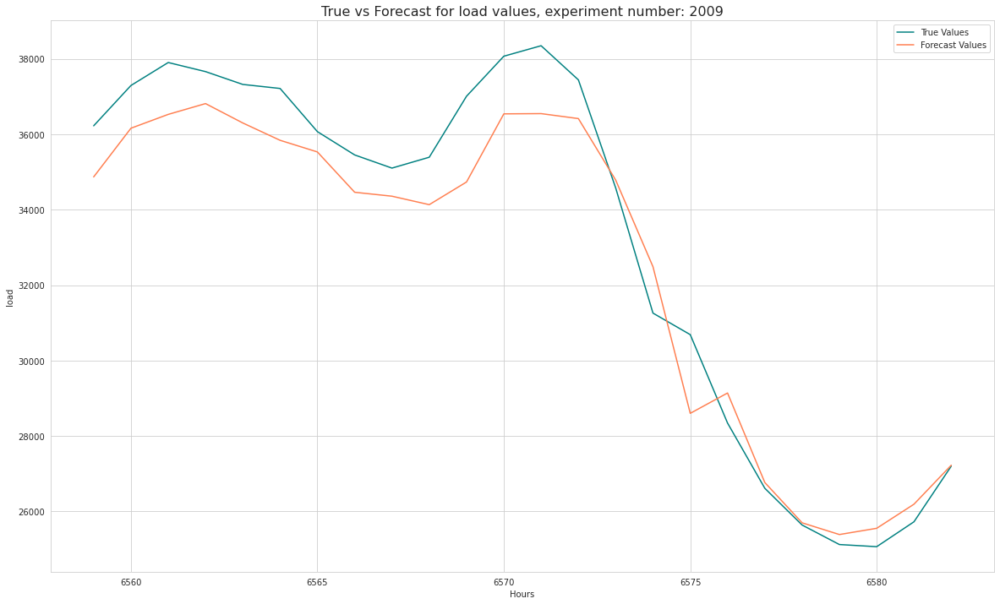

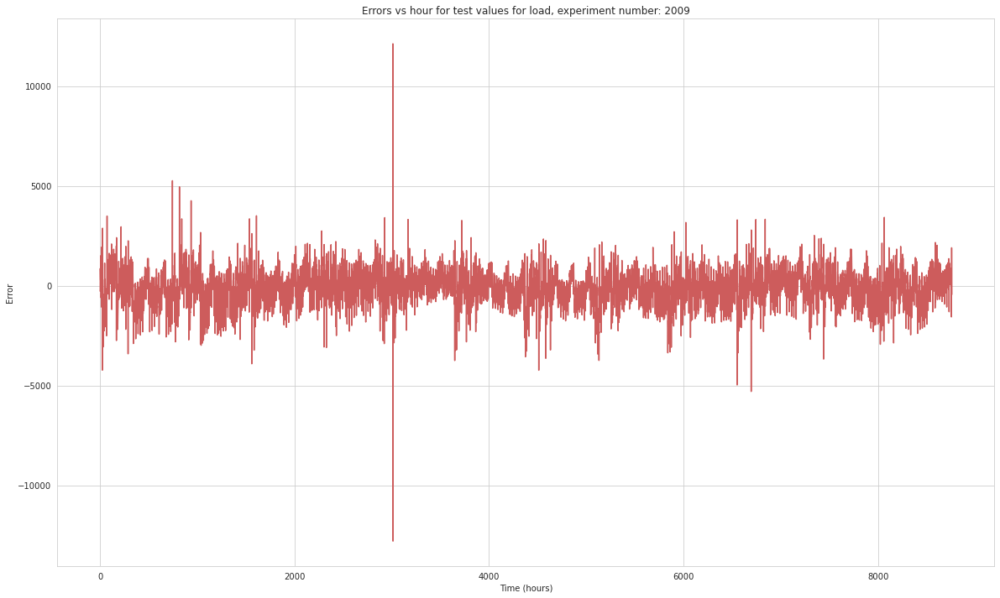




Plots for Experiment 1989


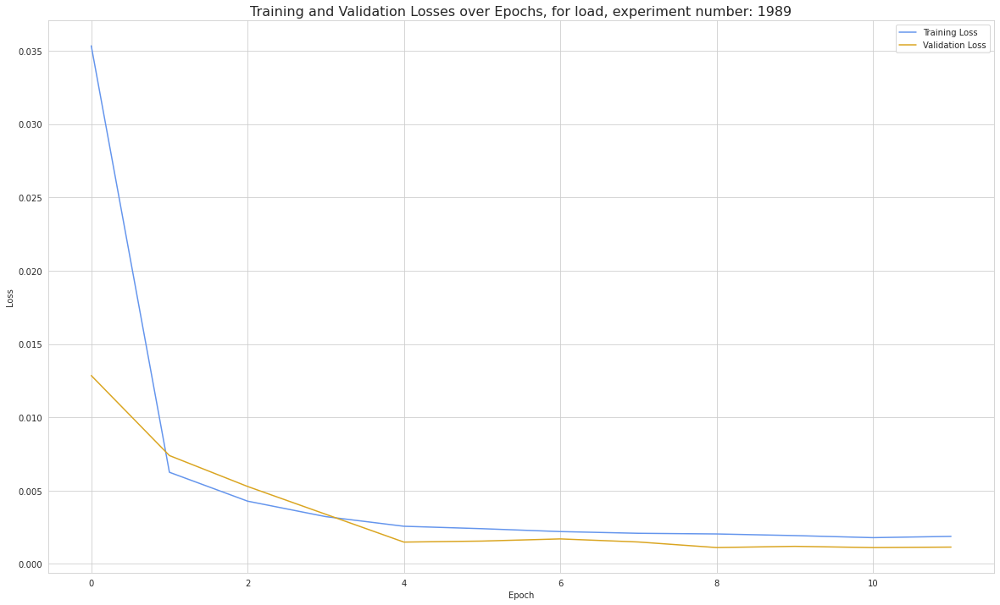

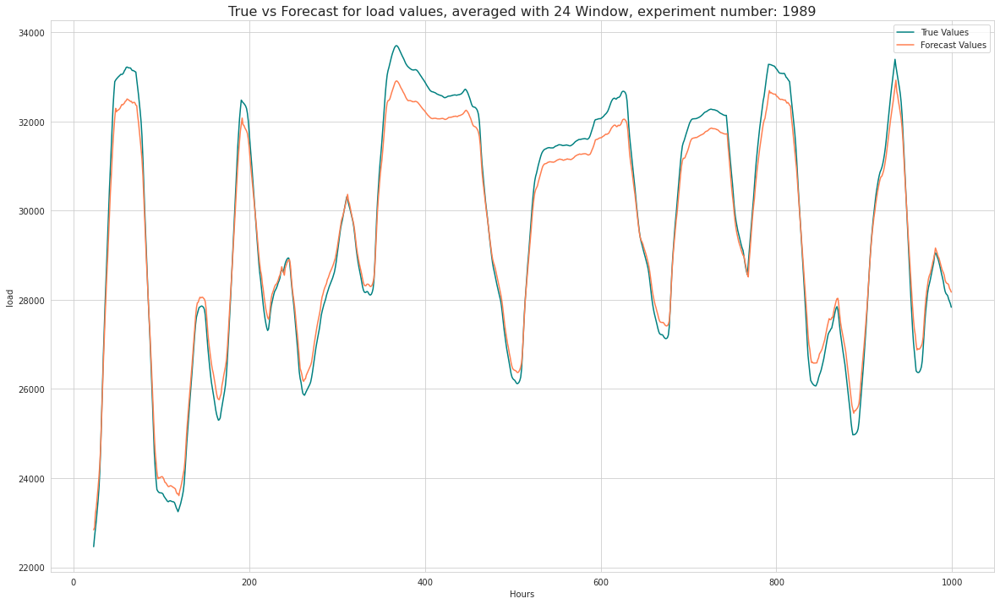

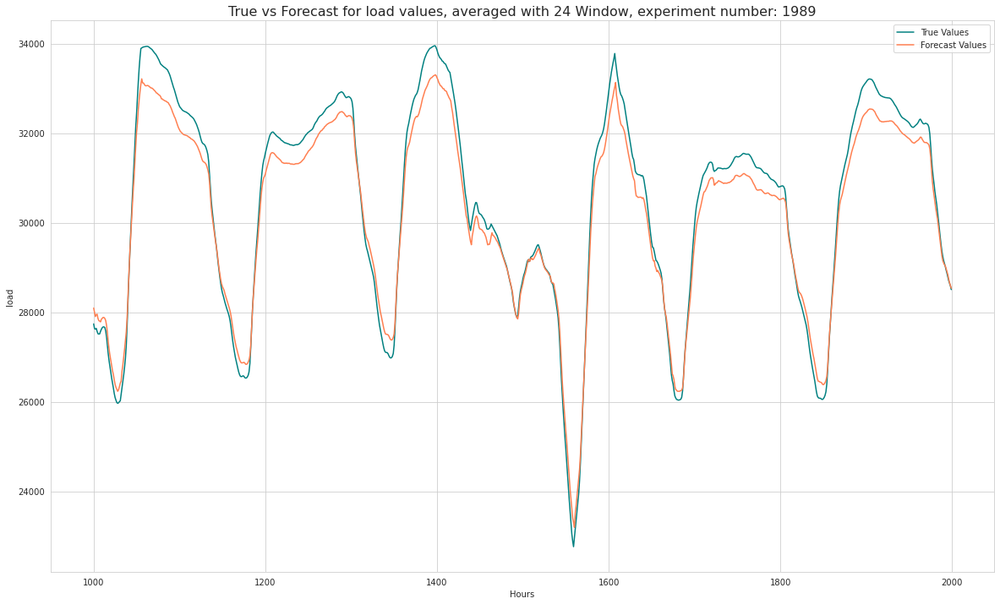

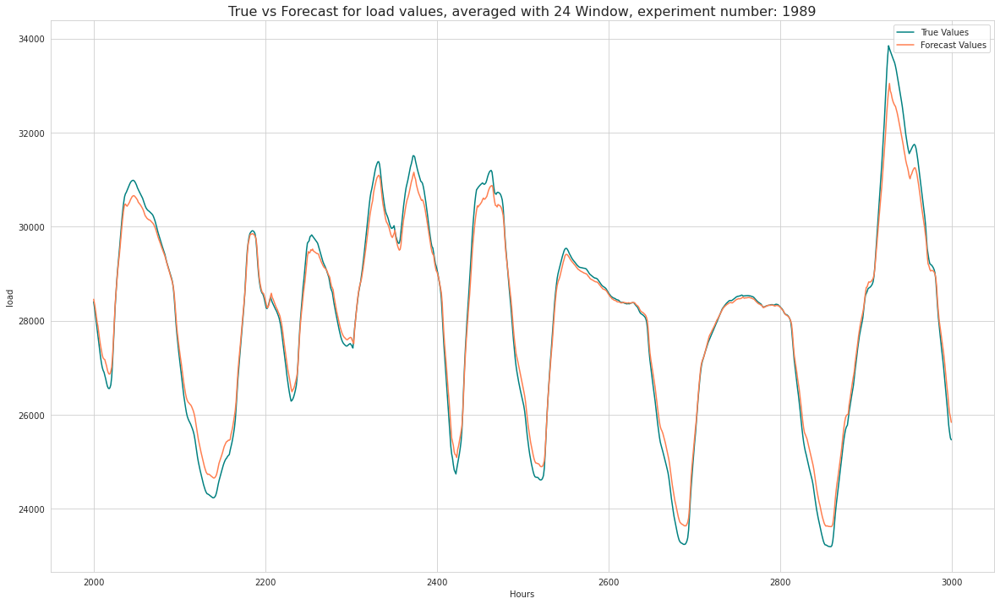

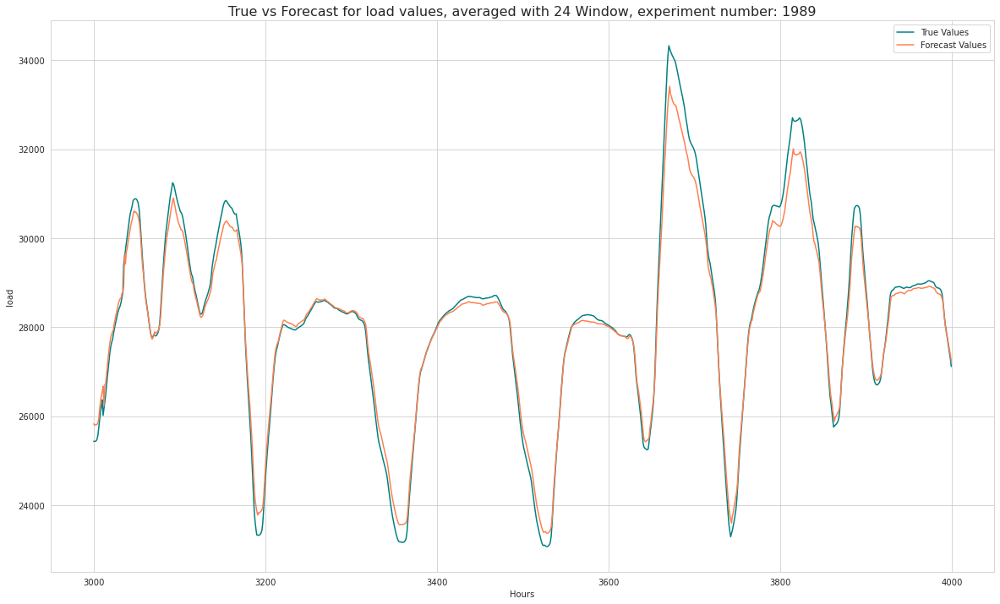

...

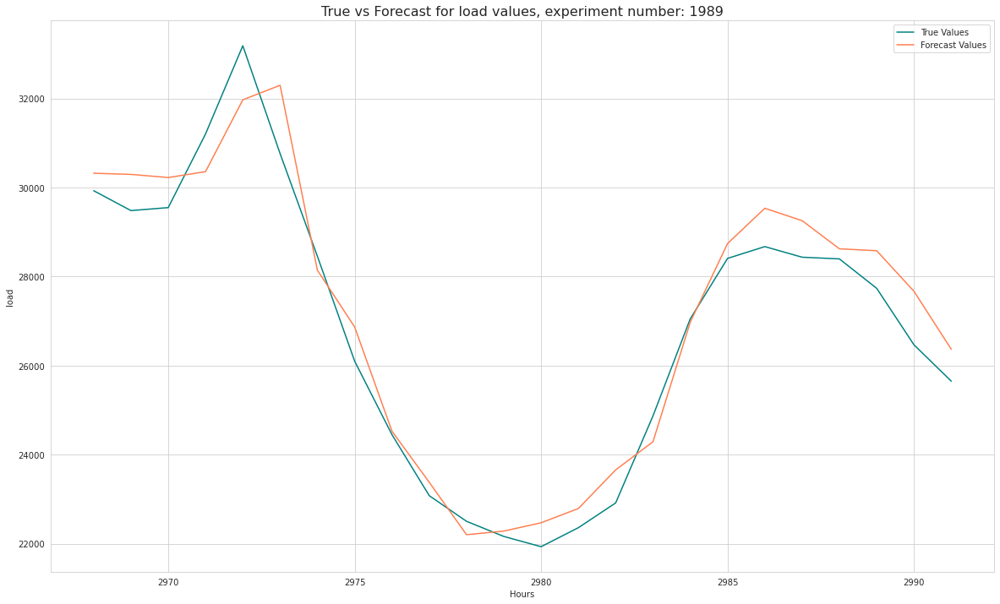

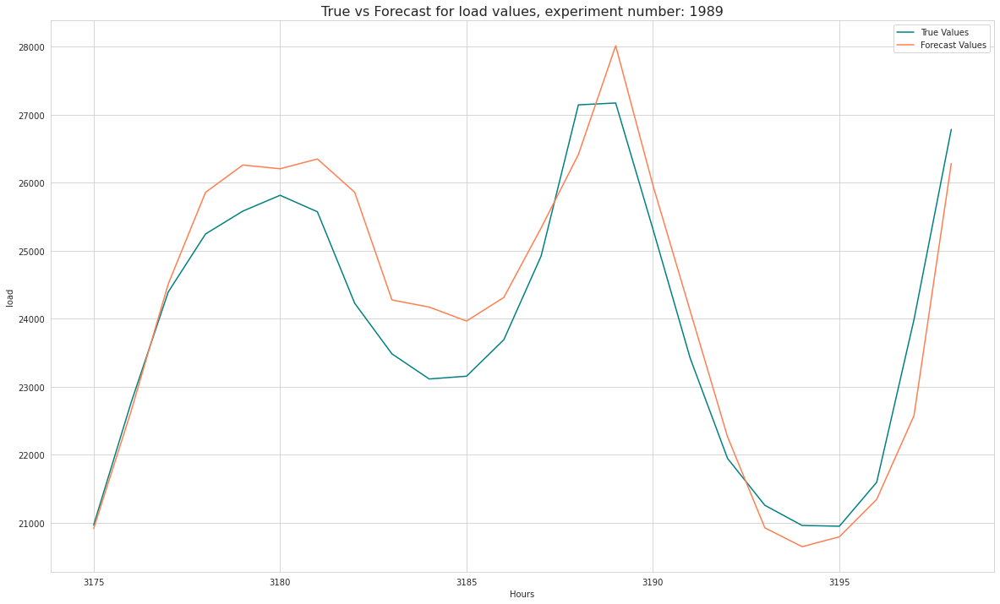

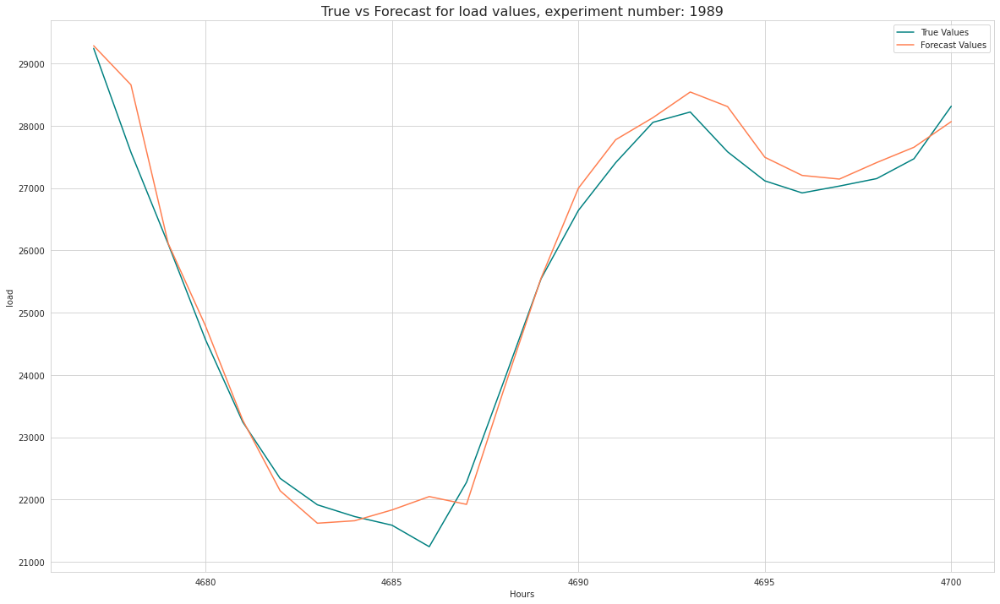

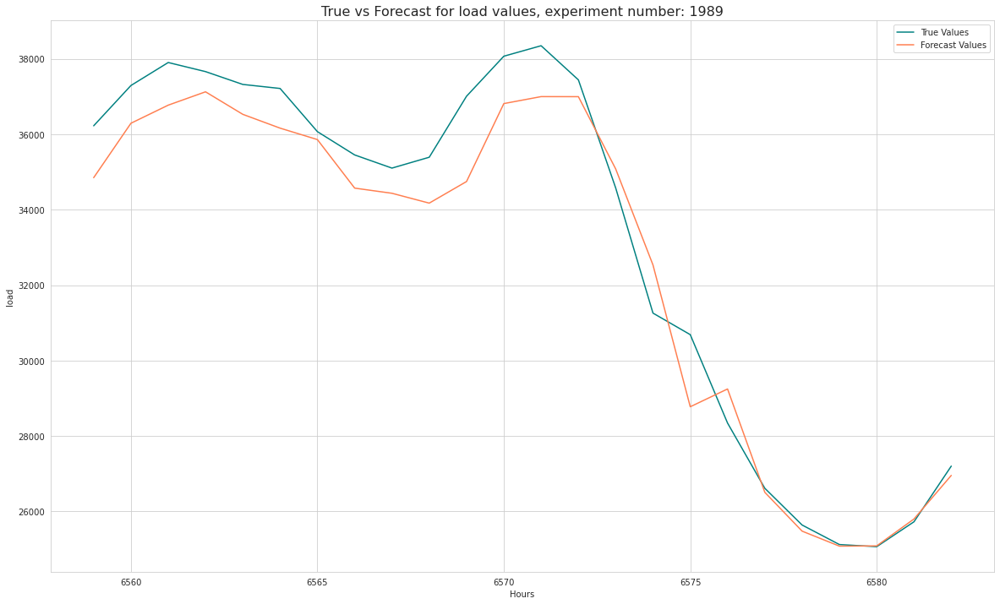

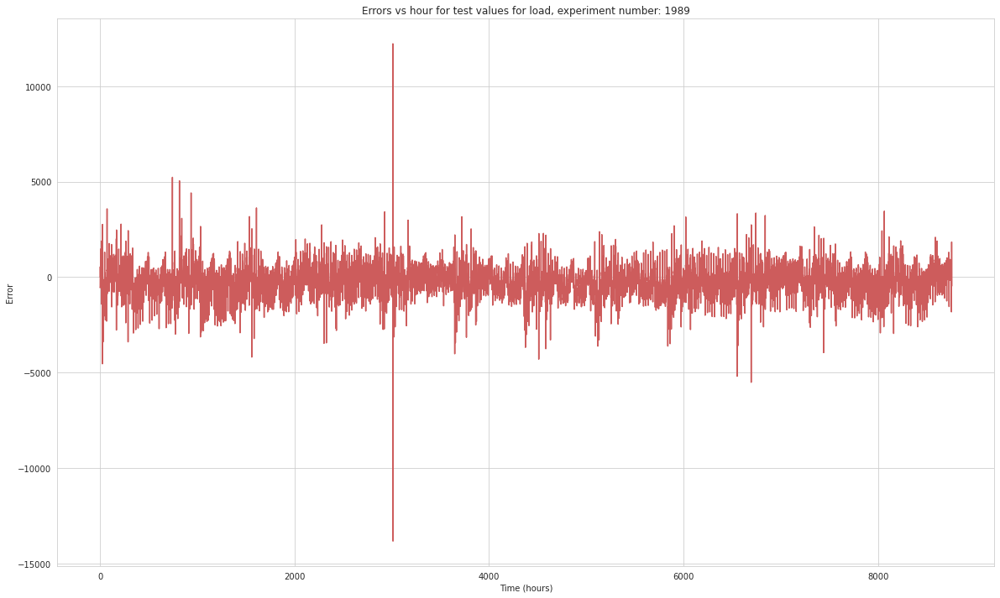

In [13]:
best_exp_ids_list = list(beui.keys()) # id's of all the best experiments saved into a simple list
print(f"Best experiment id's: {best_exp_ids_list}")

for exp_num in best_exp_ids_list:
    print(f"\n\n\nPlots for Experiment {exp_num}")
    experiment_number = experiment_results[exp_num]["experiment_number"]
    train_losses = experiment_results[exp_num]["train_losses"]
    val_losses = experiment_results[exp_num]["val_losses"]
    true_values = experiment_results[exp_num]["true_denorm"]
    forecast_values = experiment_results[exp_num]["forecast_denorm"]
    plot_losses(train_losses, val_losses, "load", f"experiment number: {experiment_number}")
    plot_forecast_vs_true_values(true_values, forecast_values, "load", f"experiment number: {experiment_number}")
    plot_random_hourly_forecast_periods(true_values, forecast_values, "load", f"experiment number: {experiment_number}")
    plot_errors(true_values, forecast_values, "load", f"experiment number: {experiment_number}")
    
    

<h3>Storing Results in Dataframes</h3>

In [14]:
# Saving all experiment results to a .csv file: 
keys_to_extract = [
    "experiment_number", "hidden_dim", "lr", "lstm_dropout", "optimiser", "test_loss", "mase", 
    "latter_val_gradient", "val_loss_stabilisation", "forecast_bias", "computation_time"]

best_experiments_dict_for_export = {
    k: {sub_key: experiment_results[k][sub_key] for sub_key in keys_to_extract}
    for k in beui if k in experiment_results}

all_experiments_dict_for_export = {k: {sub_key: experiment_results[k].get(sub_key, "N/A") 
                                       for sub_key in keys_to_extract} 
                                   for k in experiment_results}

def format_results_to_df(results_dict, best_results=True):
    
    cross_val_results_df = pd.DataFrame(results_dict).T
    if best_results == True:
        cross_val_results_df.reset_index(drop=True, inplace=True)
    cross_val_results_df.index = range(1, len(cross_val_results_df) + 1)
    cross_val_results_df.rename(columns={
        "experiment_number": "exp_num",
        "hidden_dim": "hd", 
        "lstm_dropout": "drop.", 
        "optimiser": "opt.",
        "val_loss_stabilisation": "l.stabil.",
        "latter_val_gradient": "l.grad.",
        "forecast_bias": "bias", 
        "computation_time": "time"
    }, inplace=True)
    
    for col in cross_val_results_df.columns:
        if col not in ("exp_num", "hd", "optimiser"):
            for index, value in cross_val_results_df[col].iteritems():
                if value == 0:
                    cross_val_results_df.at[index, col] = 0
                # The second condition here shouldn't be needed but it is:
                elif isinstance(value, str) and col == "l.stabil.":
                    cross_val_results_df.at[index, col] = "N/A"
                elif isinstance(value, (int, float)) and col not in ("lr", "drop.", "mase"):
                    # REF: https://stackoverflow.com/questions/3410976/how-to-round-a-number-to-significant-figures-in-python
                    #rounded = round(value, 4 - int(np.floor(np.log10(abs(value)))) - 1)
                    rounded_value = "{:.1e}".format(value)
                    cross_val_results_df.at[index, col] = rounded_value
                elif col == "bias":
                    formatted_drop = "{:.1e}".format(value)
                    cross_val_results_df.at[index, col] = formatted_drop
                elif col == "mase":
                    formatted_drop = "{:.2f}".format(value)
                    cross_val_results_df.at[index, col] = formatted_drop
                elif col == "drop.":
                    formatted_drop = "{:.2f}".format(value)
                    cross_val_results_df.at[index, col] = formatted_drop
                elif col == "time":
                    formatted_drop = "{:.2f}".format(value)
                    cross_val_results_df.at[index, col] = formatted_drop
                elif col == "lr":
                    formatted_lr = "{:.1e}".format(value)
                    cross_val_results_df.at[index, col] = formatted_lr
    return cross_val_results_df
                    
best_cv_results_df = format_results_to_df(best_experiments_dict_for_export)
all_cv_results_df = format_results_to_df(all_experiments_dict_for_export, best_results=False)
           
best_cv_results_df.to_csv(f"best_cv_results_{experiment_start_number}.csv", index=False)
all_cv_results_df.to_csv(f"all_cv_results_{experiment_start_number}.csv", index=False)

print("\n")
display_table(best_cv_results_df, "== Best Results ==")

def split_and_assign(df):
    sections = list(np.array_split(df, np.ceil(len(df) / 16))) 
    for i, section in enumerate(sections, start=1):
        # REF: https://www.programiz.com/python-programming/methods/built-in/globals
        globals()[f"all_cv_results_df{i}"] = section

split_and_assign(all_cv_results_df)

for i in range(1, int(np.ceil(len(all_cv_results_df) / 16)) + 1):
    display_table(globals()[f"all_cv_results_df{i}"], f"== All Results {i} ==")

# Storing time series data for best experiments: 
time_series_columns = ["train_losses", "val_losses", "true_denorm", "forecast_denorm"]

for experiment_number, experiment_data in experiment_results.items():
    if experiment_number not in best_exp_ids_list:
        continue
    
    data = {col: experiment_data[col] for col in time_series_columns if col in experiment_data}
    
    max_length = max(len(v) for v in data.values())
    
    for col, values in data.items():
        padding_length = max_length - len(values)
        if isinstance(values, np.ndarray):
            padding = np.full(padding_length, np.nan)
            data[col] = np.concatenate([values, padding])
        else:
            data[col] = values + [None] * padding_length
    
    df = pd.DataFrame(data)
    
    file_path = f"saved_result_time_series/{cv_model_name}_exp_{experiment_number}.csv"
    df.to_csv(file_path, index=False)




== Best Results ==


,hd,lr,drop.,opt.,test_loss,mase,l.grad.,l.stabil.,bias,time
exp_num,,,,,,,,,,
1971,100,1.0e-03,0.20,RMSProp,1.2e-03,0.53,-3.4e-05,N/A,2.4e-03,3.5e-01
2007,400,1.0e-03,0.20,RMSProp,2.8e-03,0.88,-5.9e-03,N/A,-3.2e-02,3.9e-01
2016,400,1.0e-04,0.80,Adam,4.3e-03,1.16,-2.0e-06,N/A,4.0e-02,4.2e-01
1983,100,1.0e-05,0.20,RMSProp,2.9e-02,2.95,-1.5e-03,5.4e-04,-9.6e-02,3.5e-01
2009,400,1.0e-03,0.50,RMSProp,1.4e-03,0.59,1.5e-05,N/A,-1.4e-03,3.9e-01
1989,200,1.0e-03,0.20,RMSProp,1.3e-03,0.54,-2.6e-05,N/A,-7.2e-03,3.8e-01




== All Results 1 ==


,hd,lr,drop.,opt.,test_loss,mase,l.grad.,l.stabil.,bias,time
exp_num,,,,,,,,,,
1970,100,1.0e-03,0.20,Adam,1.4e-03,0.62,-6.6e-05,N/A,1.7e-02,4.5e-01
1971,100,1.0e-03,0.20,RMSProp,1.2e-03,0.53,-3.4e-05,N/A,2.4e-03,3.5e-01
1972,100,1.0e-03,0.50,Adam,1.5e-03,0.64,5.2e-05,N/A,1.8e-02,3.8e-01
1973,100,1.0e-03,0.50,RMSProp,1.4e-03,0.60,-8.3e-06,N/A,-1.2e-02,3.5e-01
1974,100,1.0e-03,0.80,Adam,1.7e-03,0.70,8.2e-05,N/A,-6.3e-03,3.8e-01
1975,100,1.0e-03,0.80,RMSProp,2.2e-03,0.78,-4.3e-04,N/A,-1.8e-02,3.5e-01
1976,100,1.0e-04,0.20,Adam,6.1e-03,1.37,-6.2e-04,N/A,1.5e-02,3.8e-01
1977,100,1.0e-04,0.20,RMSProp,3.3e-03,0.95,-1.5e-04,N/A,-1.5e-02,3.5e-01
1978,100,1.0e-04,0.50,Adam,5.4e-03,1.27,-1.6e-04,N/A,1.3e-02,3.8e-01




== All Results 2 ==


,hd,lr,drop.,opt.,test_loss,mase,l.grad.,l.stabil.,bias,time
exp_num,,,,,,,,,,
1984,100,1.0e-05,0.50,Adam,2.7e-02,2.93,-1.6e-03,N/A,-8.4e-02,3.8e-01
1985,100,1.0e-05,0.50,RMSProp,2.3e-02,2.66,-1.4e-03,N/A,-6.6e-02,3.5e-01
1986,100,1.0e-05,0.80,Adam,2.7e-02,2.90,-1.9e-03,N/A,-6.3e-02,3.8e-01
1987,100,1.0e-05,0.80,RMSProp,2.4e-02,2.76,-1.5e-03,N/A,-6.3e-02,3.5e-01
1988,200,1.0e-03,0.20,Adam,8.8e-03,1.88,3.2e-04,N/A,8.7e-02,4.1e-01
1989,200,1.0e-03,0.20,RMSProp,1.3e-03,0.54,-2.6e-05,N/A,-7.2e-03,3.8e-01
1990,200,1.0e-03,0.50,Adam,2.4e-03,0.87,2.0e-04,N/A,3.2e-02,4.1e-01
1991,200,1.0e-03,0.50,RMSProp,2.0e-03,0.72,3.3e-04,N/A,-1.9e-02,3.8e-01
1992,200,1.0e-03,0.80,Adam,1.4e-03,0.61,-1.4e-04,N/A,-6.8e-03,4.1e-01




== All Results 3 ==


,hd,lr,drop.,opt.,test_loss,mase,l.grad.,l.stabil.,bias,time
exp_num,,,,,,,,,,
1998,200,1.0e-04,0.80,Adam,4.2e-03,1.12,-3.9e-04,N/A,1.7e-02,4.1e-01
1999,200,1.0e-04,0.80,RMSProp,3.6e-03,1.03,-1.6e-04,N/A,1.1e-02,3.8e-01
2000,200,1.0e-05,0.20,Adam,1.9e-02,2.28,2.5e-05,N/A,-6.3e-02,4.1e-01
2001,200,1.0e-05,0.20,RMSProp,1.8e-02,2.26,1.3e-04,N/A,-6.3e-02,3.8e-01
2002,200,1.0e-05,0.50,Adam,2.7e-02,2.79,4.4e-04,N/A,-1.1e-01,4.1e-01
2003,200,1.0e-05,0.50,RMSProp,2.0e-02,2.39,1.7e-05,N/A,-8.1e-02,3.8e-01
2004,200,1.0e-05,0.80,Adam,1.8e-02,2.27,-5.6e-04,N/A,-4.4e-02,4.1e-01
2005,200,1.0e-05,0.80,RMSProp,2.5e-02,2.63,2.1e-04,N/A,-9.4e-02,3.8e-01
2006,400,1.0e-03,0.20,Adam,7.4e-03,1.71,3.0e-04,N/A,7.9e-02,3.9e-01




== All Results 4 ==


,hd,lr,drop.,opt.,test_loss,mase,l.grad.,l.stabil.,bias,time
exp_num,,,,,,,,,,
2011,400,1.0e-03,0.80,RMSProp,1.8e-03,0.69,-3.2e-04,N/A,-2.1e-02,3.9e-01
2012,400,1.0e-04,0.20,Adam,5.1e-03,1.29,-2.3e-04,N/A,5.6e-02,4.2e-01
2013,400,1.0e-04,0.20,RMSProp,1.9e-03,0.69,-1.1e-04,N/A,-3.4e-03,3.9e-01
2014,400,1.0e-04,0.50,Adam,3.7e-03,1.05,-5.9e-04,N/A,3.9e-02,4.2e-01
2015,400,1.0e-04,0.50,RMSProp,2.5e-03,0.83,-6.5e-06,N/A,2.2e-02,3.9e-01
2016,400,1.0e-04,0.80,Adam,4.3e-03,1.16,-2.0e-06,N/A,4.0e-02,4.2e-01
2017,400,1.0e-04,0.80,RMSProp,3.2e-03,0.95,2.3e-05,N/A,1.2e-02,3.9e-01
2018,400,1.0e-05,0.20,Adam,2.1e-02,2.39,-7.9e-04,N/A,-9.0e-02,4.1e-01
2019,400,1.0e-05,0.20,RMSProp,2.5e-02,2.73,-8.6e-04,N/A,-1.2e-01,3.9e-01
